In [1]:
here::i_am("atac/archR/pseudobulk/2_archR_pseudobulk.R")
source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))

######################
## Define arguments ##
######################

# p <- ArgumentParser(description='')
# p$add_argument('--archr_directory',    type="character",    help='ArchR directory')
# p$add_argument('--metadata',    type="character",    help='metadata file')
# p$add_argument('--outdir',     type="character",    help='Output directory')
# p$add_argument('--group_by',     type="character",    help='Metadata column to group by')
# p$add_argument('--matrices',     type="character",       nargs="+",   help='Matrices to pseudobulk')
# p$add_argument('--threads',     type="integer",    default=1,    help='Number of threads')

# args <- p$parse_args(commandArgs(TRUE))

## START TEST ##
args = list()
args$metadata <- "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update.txt.gz"
## END TEST ##

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
      

In [88]:
########################
## Load cell metadata ##
########################

cell_metadata.dt <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE]

In [ ]:

########################
## Load ArchR project ##
########################

# source(here::here("atac/archR/load_archR_project.R"))

setwd(args$archr_directory)

addArchRGenome("mm10")
addArchRThreads(threads = args$threads)

# Subset
ArchRProject <- loadArchRProject(args$archr_directory)[cell_metadata.dt$cell]

# Sanity checks
stopifnot(args$matrices%in%getAvailableMatrices(ArchRProject))


In [8]:
list.files(paste0(io$archr.chromvar.dir, '/cells/'))

[1] "chromVAR_deviations_CISBP_archr.rds" 
[2] "chromVAR_deviations_JASPAR_archr.rds"

In [99]:
library(scater)
library(uwot)

In [74]:
test = readRDS(paste0(io$archr.chromvar.dir, '/cells/chromVAR_deviations_CISBP_archr.rds'))

In [ ]:
test@assays@data$logcounts = test@assays@data$z

In [78]:
test = calculatePCA(test, scale=TRUE)

In [80]:
umap = umap(test[,1:25])

In [81]:
colnames(umap) = c('umap1', 'umap2')

In [89]:
cell_metadata.dt = cbind(cell_metadata.dt, as.data.table(umap[match(cell_metadata.dt$cell, rownames(umap)),]))

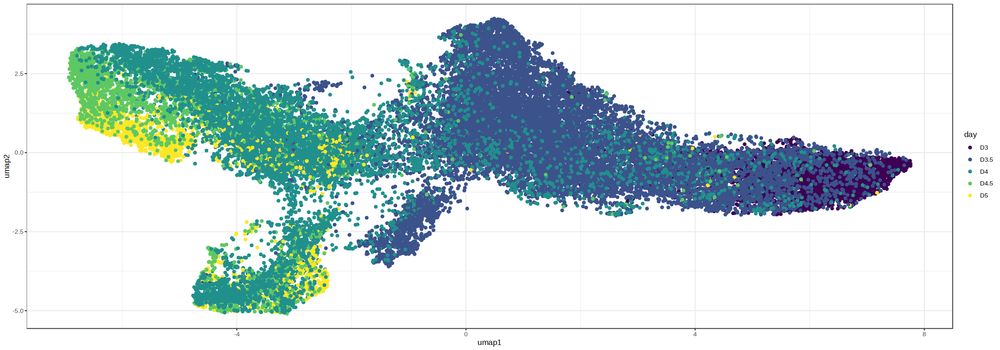

In [92]:
options(repr.plot.width=20)
ggplot(cell_metadata.dt, aes(umap1, umap2, col=day)) +
    geom_point() + 
    scale_color_manual(values =opts$days.colors) + 
    theme_bw()

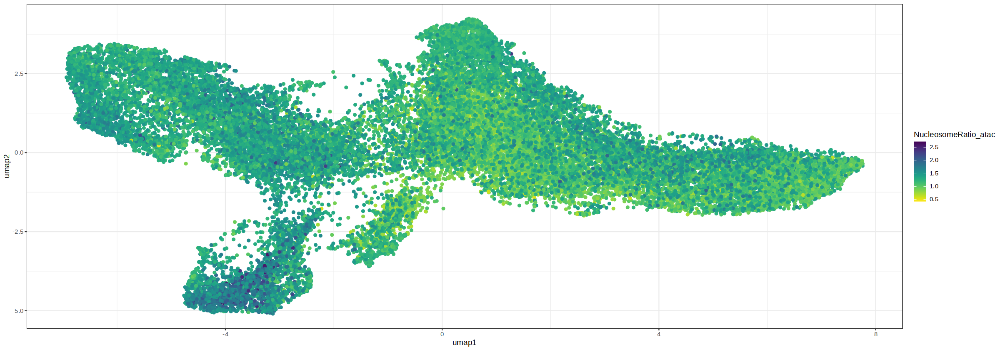

In [98]:
ggplot(cell_metadata.dt, aes(umap1, umap2, col=NucleosomeRatio_atac)) +
    geom_point() + 
    viridis::scale_color_viridis(begin=1, end=0) + 
    theme_bw()

In [100]:
test = readRDS(paste0(io$archr.chromvar.dir, '/cells/chromVAR_deviations_JASPAR_archr.rds'))

In [102]:
test@assays@data$logcounts = test@assays@data$z

In [103]:
test = calculatePCA(test, scale=TRUE)

In [104]:
umap = umap(test[,1:25])

In [105]:
colnames(umap) = c('umap1', 'umap2')

In [109]:
cell_metadata.dt <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE]

cell_metadata.dt = cbind(cell_metadata.dt, as.data.table(umap[match(cell_metadata.dt$cell, rownames(umap)),]))

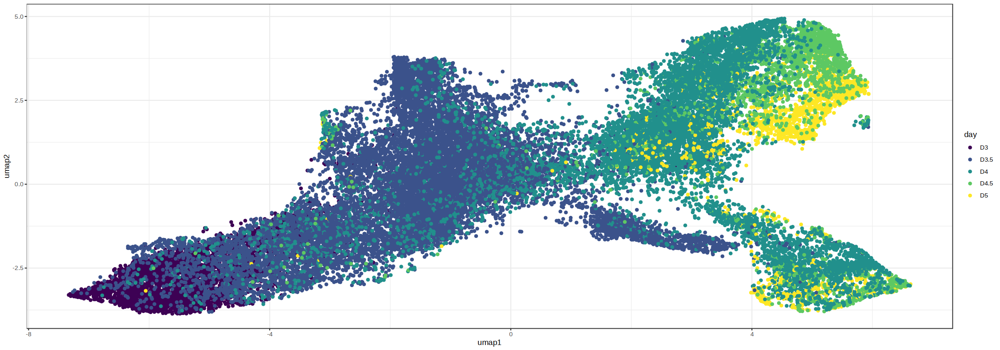

In [110]:
options(repr.plot.width=20)
ggplot(cell_metadata.dt, aes(umap1, umap2, col=day)) +
    geom_point() + 
    scale_color_manual(values =opts$days.colors) + 
    theme_bw()

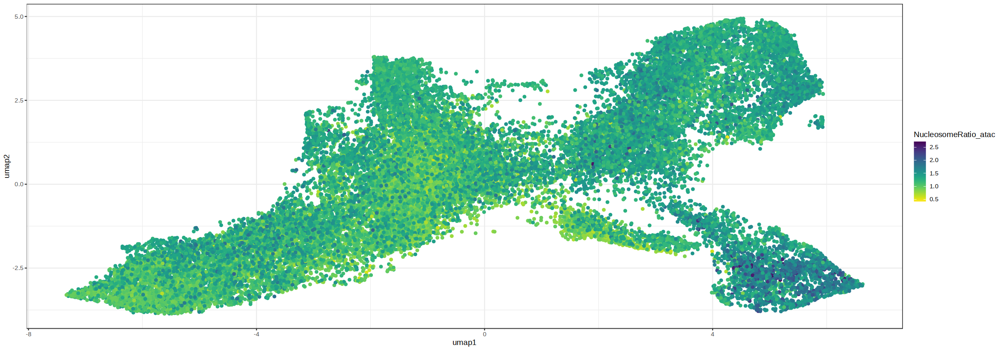

In [111]:
ggplot(cell_metadata.dt, aes(umap1, umap2, col=NucleosomeRatio_atac)) +
    geom_point() + 
    viridis::scale_color_viridis(begin=1, end=0) + 
    theme_bw()

In [ ]:
/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update_PeakClusters.txt.gz 
/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update_PeakClusters.txt.gz

In [2]:

## START TEST ##
args = list()
args$archr_directory <- file.path(io$basedir,"processed/atac/archR")
args$metadata <- "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update_PeakClusters.txt.gz"
args$group_by <- "Clusters_PeakMatrix2"
args$matrices <- c("PeakMatrix")
args$threads <- 1
args$outdir <- "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/pseudobulk/Clusters_PeakMatrix2/PeakMatrix"
## END TEST ##

# Parse arguments
dir.create(args$outdir, showWarnings=F, recursive=T)

########################
## Load cell metadata ##
########################

cell_metadata.dt <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE | pass_atacQC==TRUE & is.na(doublet_call)]
stopifnot(args$group_by%in%colnames(cell_metadata.dt))
cell_metadata.dt <- cell_metadata.dt[!is.na(cell_metadata.dt[[args$group_by]])]

table(cell_metadata.dt[[args$group_by]])



  C1  C10  C11  C12  C13  C14  C15  C16  C17  C18  C19   C2  C20  C21  C22  C23 
 251  210 5809 2054  550 1997 5315 2976  364  891   54  403  954 1235  793  692 
 C24  C25   C3   C4   C5   C6   C7   C8   C9 
1830 2800  783 1011 1466  826 1288  498  486 

In [3]:
args$group_by%in%colnames(cell_metadata.dt)


[1] TRUE

In [4]:
head(cell_metadata.dt)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,⋯,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,Clusters_TileMatrix0.5,Clusters_TileMatrix_genotype,Clusters_PeakMatrix2,Clusters_PeakMatrix_genotype,Clusters_PeakMatrix2.1
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<int>,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,⋯,0.22,1.19,49080,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,⋯,0.17,1.56,46497,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,⋯,0.25,1.27,83426,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,⋯,0.21,1.48,30196,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_wt_rep1,D3,wt,⋯,0.21,1.48,13455,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_wt_rep1,D3,wt,⋯,0.23,1.33,9315,0.02,TRUE,C2,C2wt,C11,C11wt,C11


In [11]:
args$archr_directory <- file.path(io$basedir,"processed/atac/archR")


In [13]:
########################
## Load ArchR project ##
########################

# source(here::here("atac/archR/load_archR_project.R"))

setwd(args$archr_directory)

addArchRGenome("mm10")
addArchRThreads(threads = 1)

# Subset
ArchRProject <- loadArchRProject(args$archr_directory)[cell_metadata.dt$cell]

# Sanity checks
stopifnot(args$matrices%in%getAvailableMatrices(ArchRProject))


Setting default genome to Mm10.

Setting default number of Parallel threads to 1.

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\__

In [7]:
test = cell_metadata.dt%>% 
  .[cell%in%rownames(ArchRProject@cellColData)] %>% setkey(cell)%>% .[rownames(ArchRProject@cellColData)]%>%
  as.data.frame() %>% tibble::column_to_rownames("cell")


head(test)

,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,pass_rnaQC,⋯,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,Clusters_TileMatrix0.5,Clusters_TileMatrix_genotype,Clusters_PeakMatrix2,Clusters_PeakMatrix_genotype,Clusters_PeakMatrix2.1
,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,⋯,<dbl>,<dbl>,<int>,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,TRUE,⋯,0.22,1.19,49080,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,TRUE,⋯,0.17,1.56,46497,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,TRUE,⋯,0.25,1.27,83426,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,TRUE,⋯,0.21,1.48,30196,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_wt_rep1,D3,wt,TRUE,⋯,0.21,1.48,13455,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_wt_rep1,D3,wt,TRUE,⋯,0.23,1.33,9315,0.02,TRUE,C2,C2wt,C11,C11wt,C11


In [8]:
head(rownames(getCellColData(ArchRProject)))

[1] "1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1"
[2] "1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1"
[3] "1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1"
[4] "1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1"
[5] "1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1"
[6] "1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1"

In [9]:
test = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/pseudobulk/Clusters_PeakMatrix2/PeakMatrix/pseudobulk_PeakMatrix_summarized_experiment.rds')

In [10]:
test

class: SummarizedExperiment 
dim: 238993 25 
metadata(0):
assays(1): PeakMatrix
rownames(238993): chr1:3003473-3004073 chr1:3035580-3036180 ...
  chrX:169923276-169923876 chrX:169925415-169926015
rowData names(4): seqnames idx start end
colnames(25): C1 C10 ... C8 C9
colData names(27): TSSEnrichment ReadsInTSS ... FRIP nCells

In [11]:
peakset.gr = ArchRProject@peakSet

In [12]:
peakset.gr

GRanges object with 238993 ranges and 13 metadata columns:
             seqnames              ranges strand |     score
                <Rle>           <IRanges>  <Rle> | <numeric>
  C6eomes_ko     chr1     3003473-3004073      * |  36.14750
        C1wt     chr1     3035580-3036180      * |  36.26170
  C2eomes_ko     chr1     3062632-3063232      * |   6.54799
  C7eomes_ko     chr1     3191587-3192187      * |  98.53060
  C1eomes_ko     chr1     3263569-3264169      * |  18.63610
         ...      ...                 ...    ... .       ...
  C7eomes_ko     chrX 169883763-169884363      * |  53.59860
  C6eomes_ko     chrX 169899134-169899734      * |  47.64190
        C3wt     chrX 169906109-169906709      * |  35.06550
  C6eomes_ko     chrX 169923276-169923876      * |   7.69711
  C7eomes_ko     chrX 169925415-169926015      * |  32.87780
             replicateScoreQuantile groupScoreQuantile Reproducibility
                          <numeric>          <numeric>       <numeric>
  C6eo

In [13]:
peakset.dt = as.data.table(peakset.gr) %>% 
    .[,type_per_gene:=.N, by=c('nearestGene', 'peakType')] %>%
    unique(by=c('nearestGene', 'peakType')) %>% 
    .[,c('nearestGene', 'peakType', 'type_per_gene')] %>% 
    dcast(nearestGene ~ peakType, value.var = "type_per_gene")
    
head(peakset.dt)

nearestGene,Distal,Exonic,Intronic,Promoter
<chr>,<int>,<int>,<int>,<int>
NA,3,NA,2,NA
0610005C13Rik,2,2,1,NA
0610009B22Rik,NA,NA,3,NA
0610009E02Rik,NA,NA,2,1
0610010F05Rik,2,NA,2,2
0610010K14Rik,NA,1,2,NA


Warning message:
“Removed 10980 rows containing missing values (`geom_point()`).”


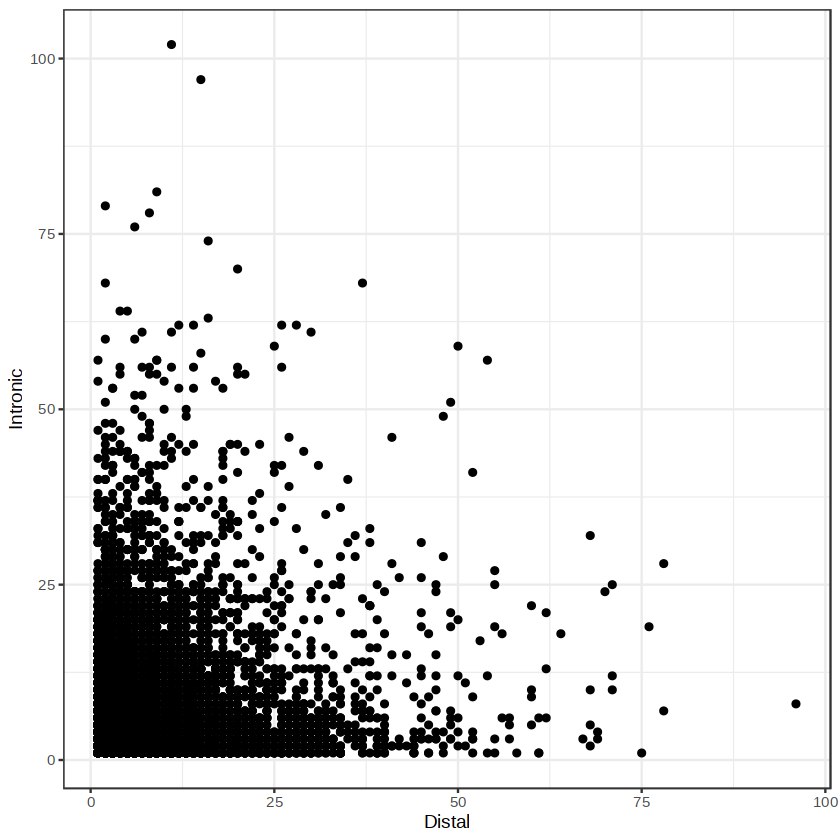

In [23]:
ggplot(peakset.dt, aes(Distal, Intronic)) + geom_point() + theme_bw()

In [14]:
head(peakset.dt[order(-Distal)])

nearestGene,Distal,Exonic,Intronic,Promoter
<chr>,<int>,<int>,<int>,<int>
Rybp,96,NA,8,3
4930572O13Rik,79,NA,NA,1
Sall1,78,NA,7,3
Zfp608,78,2,28,2
Tle3,76,1,19,3
A930031H19Rik,75,NA,1,NA


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


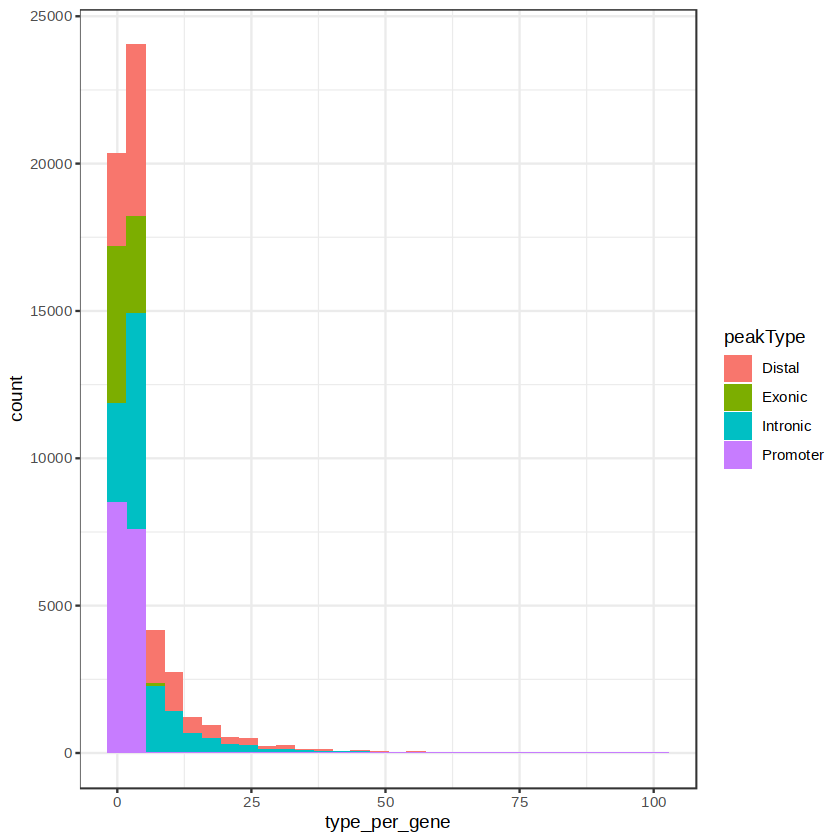

In [21]:
ggplot(peakset.dt, aes(type_per_gene, fill=peakType)) + geom_histogram() + theme_bw()

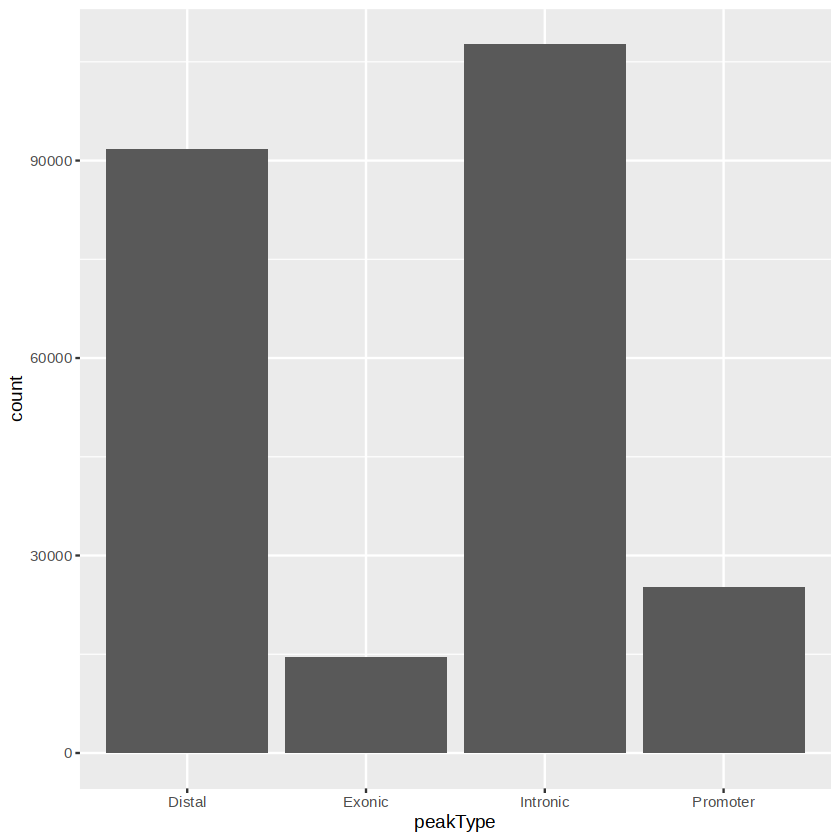

In [15]:
ggplot(as.data.table(peakset.gr), aes(peakType)) + geom_bar()

In [7]:
head(colData(test))

DataFrame with 6 rows and 27 columns
    TSSEnrichment ReadsInTSS ReadsInPromoter ReadsInBlacklist PromoterRatio
        <numeric>  <numeric>       <numeric>        <numeric>     <numeric>
C1        18.1480     3130.0         11019.0            891.0      0.302614
C10       14.9905     1683.5          6918.5            997.5      0.270268
C11       13.5660     4878.0         18967.0           1801.0      0.220096
C12       14.9050     3134.5         12012.5           1055.0      0.222375
C13       14.1865     5393.5         20475.5           1980.5      0.205359
C14       14.2560     7399.0         28276.0           2493.0      0.207215
       PassQC NucleosomeRatio nMultiFrags nMonoFrags    nFrags  nDiFrags
    <numeric>       <numeric>   <numeric>  <numeric> <numeric> <numeric>
C1          1         1.43803      5592.0       8175   18218.0    5272.0
C10         1         1.04568      2268.0       6306   12137.0    3905.5
C11         1         1.21908      8167.0      19628   43957.0 

In [2]:
args = list()
args$cells_metadata <- '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/qc/sample_metadata_update_PeakClusters.txt.gz'
#args$metacells_metadata <- file.path(io$basedir,"results/atac/archR/metacells/GeneScoreMatrix_TSS/metacells_metadata.txt.gz")
# args$pseudobulk_metadata <- file.path(io$basedir,"results/atac/archR/pseudobulk/celltype/stats.txt")
args$matrix <- "PeakMatrix"
args$group_by <- "Clusters_PeakMatrix2"
args$atac_matrix_cells <- '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Matrices/PeakMatrix_summarized_experiment.rds'
#args$atac_matrix_metacells <- file.path(io$basedir,sprintf("results/atac/archR/metacells/%s/%s_summarized_experiment_metacells.rds",args$matrix,args$matrix))
args$atac_matrix_pseudobulk <- '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/pseudobulk/Clusters_PeakMatrix2/PeakMatrix/pseudobulk_PeakMatrix_summarized_experiment.rds'
args$ignore_small_groups <- TRUE
#args$outfile <- file.path(io$basedir, sprintf("results/atac/archR/feature_stats/%s/%s_%s_feature_stats.txt.gz",args$matrix,args$matrix,args$group_by))

In [3]:
cell_metadata.dt <- fread(args$cells_metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE | pass_atacQC==TRUE & is.na(doublet_call)]
cell_metadata.dt <- cell_metadata.dt[!is.na(cell_metadata.dt[[args$group_by]])]
group_stats.dt <- cell_metadata.dt[,.(n_cells=.N),by=eval(args$group_by)]

opts$min_cells <- 50
  groups.to.use <- group_stats.dt[n_cells>=opts$min_cells ]
  cell_metadata.dt <- cell_metadata.dt %>% .[eval(as.name(args$group_by))%in%groups.to.use[[args$group_by]]]
head(cell_metadata.dt)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,⋯,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,Clusters_TileMatrix0.5,Clusters_TileMatrix_genotype,Clusters_PeakMatrix2,Clusters_PeakMatrix_genotype,Clusters_PeakMatrix2.1
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<int>,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,⋯,0.22,1.19,49080,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,⋯,0.17,1.56,46497,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,⋯,0.25,1.27,83426,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,⋯,0.21,1.48,30196,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_wt_rep1,D3,wt,⋯,0.21,1.48,13455,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_wt_rep1,D3,wt,⋯,0.23,1.33,9315,0.02,TRUE,C2,C2wt,C11,C11wt,C11


In [4]:
########################
## Load cell metadata ##
########################

cell_metadata.dt <- fread(args$cells_metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE | pass_atacQC==TRUE & is.na(doublet_call)]


stopifnot(args$group_by%in%colnames(cell_metadata.dt))
cell_metadata.dt <- cell_metadata.dt[!is.na(cell_metadata.dt[[args$group_by]])]

############################
## Load metacell metadata ##
############################

# if (grepl("genotype",args$group_by)) {
#   metacell_metadata.dt <- fread(args$metacells_metadata) %>%
#     .[,celltype_genotype:=sprintf("%s-%s",celltype,genotype)]
# } else {
#   metacell_metadata.dt <- fread(args$metacells_metadata) %>% .[genotype=="WT"]
# }

# stopifnot(args$group_by%in%colnames(metacell_metadata.dt))
# metacell_metadata.dt <- metacell_metadata.dt[!is.na(metacell_metadata.dt[[args$group_by]])]

###################
## Filter groups ##
###################

group_stats.dt <- cell_metadata.dt[,.(n_cells=.N),by=eval(args$group_by)]

# subset groups with sufficient number of cells
opts$min_cells <- 50
if (args$ignore_small_groups) {
  groups.to.use <- group_stats.dt[n_cells>=opts$min_cells ]
  cell_metadata.dt <- cell_metadata.dt %>% .[eval(as.name(args$group_by))%in%groups.to.use[[args$group_by]]]
  #metacell_metadata.dt <- metacell_metadata.dt %>% .[eval(as.name(args$group_by))%in%groups.to.use]
}

######################
## Load ATAC Matrix ##
######################

# cells
print(sprintf("Fetching single-cell ATAC %s matrix...",args$matrix))
atac_cells.se <- readRDS(args$atac_matrix_cells)[,cell_metadata.dt$cell]
atac_cells.se

# # metacells
# print(sprintf("Fetching metacells ATAC %s matrix...",args$matrix))
# atac_metacells.se <- readRDS(args$atac_matrix_metacells)[,metacell_metadata.dt$metacell]
# atac_metacells.se



[1] "Fetching single-cell ATAC PeakMatrix matrix..."


class: RangedSummarizedExperiment 
dim: 238993 35536 
metadata(0):
assays(1): PeakMatrix
rownames(238993): chr1:3003473-3004073 chr1:3035580-3036180 ...
  chrX:169923276-169923876 chrX:169925415-169926015
rowData names(1): idx
colnames(35536): 1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1
  1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(38): BlacklistRatio nDiFrags ... ReadsInPeaks FRIP

In [60]:
# pseudobulk
print(sprintf("Fetching pseudobulk ATAC %s matrix...",args$matrix))
atac_pseudobulk.se <- readRDS(args$atac_matrix_pseudobulk)[,groups.to.use[[args$group_by]]]
atac_pseudobulk.se


[1] "Fetching pseudobulk ATAC PeakMatrix matrix..."


class: SummarizedExperiment 
dim: 238993 25 
metadata(0):
assays(1): PeakMatrix
rownames(238993): chr1:3003473-3004073 chr1:3035580-3036180 ...
  chrX:169923276-169923876 chrX:169925415-169926015
rowData names(4): seqnames idx start end
colnames(25): C11 C12 ... C6 C7
colData names(27): TSSEnrichment ReadsInTSS ... FRIP nCells

In [52]:
summary(rownames(atac_cells.se)==rownames(atac_pseudobulk.se))

   Mode   FALSE    TRUE 
logical  217104   21889 

In [53]:
atac_pseudobulk.se = atac_pseudobulk.se[match(rownames(atac_cells.se), rownames(atac_pseudobulk.se))]
summary(rownames(atac_cells.se)==rownames(atac_pseudobulk.se))

   Mode    TRUE 
logical  238993 

In [54]:

# Sanity checks
stopifnot(rownames(atac_cells.se)==rownames(atac_pseudobulk.se))
#stopifnot(rownames(atac_cells.se)==rownames(atac_metacells.se))

####################
## Normalise ATAC ##
####################

print("Normalising ATAC data...")
# assay(atac_metacells.se) <- 1e6*(sweep(assay(atac_metacells.se),2,colSums(assay(atac_metacells.se),na.rm=T),"/"))
# assay(atac_metacells.se) <- log2(assay(atac_metacells.se)+0.5)

assay(atac_pseudobulk.se) <- 1e6*(sweep(assay(atac_pseudobulk.se),2,colSums(assay(atac_pseudobulk.se),na.rm=T),"/"))
assay(atac_pseudobulk.se) <- log2(assay(atac_pseudobulk.se)+0.5)

[1] "Normalising ATAC data..."


In [62]:
groupMat = atac_pseudobulk.se@assays@data$PeakMatrix

In [81]:
groupMat.log = log2(t(t(groupMat) / colSums(groupMat)) * 10^4 + 1)

In [82]:
rownames(groupMat.log) = rownames(atac_pseudobulk.se)

In [83]:
feature_stats_pseudobulk.dt <- data.table(
  feature = rownames(groupMat.log),
  var_pseudobulk2 = apply(groupMat.log,1,var) %>% round(5),
  mean_pseudobulk2 = apply(groupMat.log,1,mean) %>% round(5)
  # min_pseudobulk = apply(assay(atac_pseudobulk.se),1,min) %>% round(5),
  # max_pseudobulk = apply(assay(atac_pseudobulk.se),1,max) %>% round(5)
) %>% setkey(feature)

In [84]:
feature_stats_pseudobulk.dt = feature_stats_pseudobulk.dt[,vars3 := matrixStats::rowVars(groupMat.log)]

In [89]:
feature_stats_pseudobulk.dt = feature_stats_pseudobulk.dt[order(-var_pseudobulk2)]

In [90]:
head(feature_stats_pseudobulk.dt)

feature,var_pseudobulk2,mean_pseudobulk2,vars3
<chr>,<dbl>,<dbl>,<dbl>
chr13:9011475-9012075,0.07688,0.70194,6.448422e-03
chr8:72268248-72268848,0.03811,0.12934,3.175964e-04
chr4:115095715-115096315,0.03655,0.25662,4.693319e-04
chr6:128102507-128103107,0.03497,0.18957,7.108046e-05
chr17:12669056-12669656,0.03332,0.26820,5.167261e-04
chr17:57290142-57290742,0.03089,0.11609,1.701903e-04


In [57]:

##########################
## Calculate peak stats ##
##########################

print("Calculating feature stats...")

feature_stats_cells.dt <- data.table(
  feature = rownames(atac_cells.se),
  var_cells = sparseMatrixStats::rowVars(assay(atac_cells.se)) %>% round(5),
  mean_cells = Matrix::rowMeans(assay(atac_cells.se)) %>% round(5)
  # min_cells = apply(assay(atac_cells.se),1,min),
  # max_cells = apply(assay(atac_cells.se),1,max)
) %>% setkey(feature)

# feature_stats_metacells.dt <- data.table(
#   feature = rownames(atac_metacells.se),
#   var_metacells = apply(assay(atac_metacells.se),1,var) %>% round(5),
#   mean_metacells = apply(assay(atac_metacells.se),1,mean) %>% round(5)
#   # min_metacells = apply(assay(atac_metacells.se),1,min) %>% round(5),
#   # max_metacells = apply(assay(atac_metacells.se),1,max) %>% round(5)
# ) %>% setkey(feature)

feature_stats_pseudobulk.dt <- data.table(
  feature = rownames(atac_pseudobulk.se),
  var_pseudobulk = apply(assay(atac_pseudobulk.se),1,var) %>% round(5),
  mean_pseudobulk = apply(assay(atac_pseudobulk.se),1,mean) %>% round(5)
  # min_pseudobulk = apply(assay(atac_pseudobulk.se),1,min) %>% round(5),
  # max_pseudobulk = apply(assay(atac_pseudobulk.se),1,max) %>% round(5)
) %>% setkey(feature)

# feature_stats.dt <- merge(feature_stats_cells.dt, feature_stats_pseudobulk.dt, by="feature", suffixes=c("_singlecell","_pseudobulk"))
feature_stats.dt <- Reduce(data.table::merge.data.table,list(feature_stats_cells.dt, feature_stats_pseudobulk.dt))

print(head(feature_stats.dt))

[1] "Calculating feature stats..."
                     feature var_cells mean_cells var_pseudobulk
1: chr10:100013991-100014591   0.18513    0.08898        0.37550
2: chr10:100015416-100016016   1.27518    0.63510        0.05492
3: chr10:100016254-100016854   0.70841    0.36934        0.02266
4: chr10:100017132-100017732   0.17581    0.09466        0.18041
5: chr10:100018387-100018987   0.14059    0.07488        0.14195
6: chr10:100019846-100020446   0.12512    0.06624        0.23196
   mean_pseudobulk
1:         1.04833
2:         3.89778
3:         3.11138
4:         1.26058
5:         1.05206
6:         1.09474


In [58]:
head(feature_stats.dt)

feature,var_cells,mean_cells,var_pseudobulk,mean_pseudobulk
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
chr10:100013991-100014591,0.18513,0.08898,0.37550,1.04833
chr10:100015416-100016016,1.27518,0.63510,0.05492,3.89778
chr10:100016254-100016854,0.70841,0.36934,0.02266,3.11138
chr10:100017132-100017732,0.17581,0.09466,0.18041,1.26058
chr10:100018387-100018987,0.14059,0.07488,0.14195,1.05206
chr10:100019846-100020446,0.12512,0.06624,0.23196,1.09474


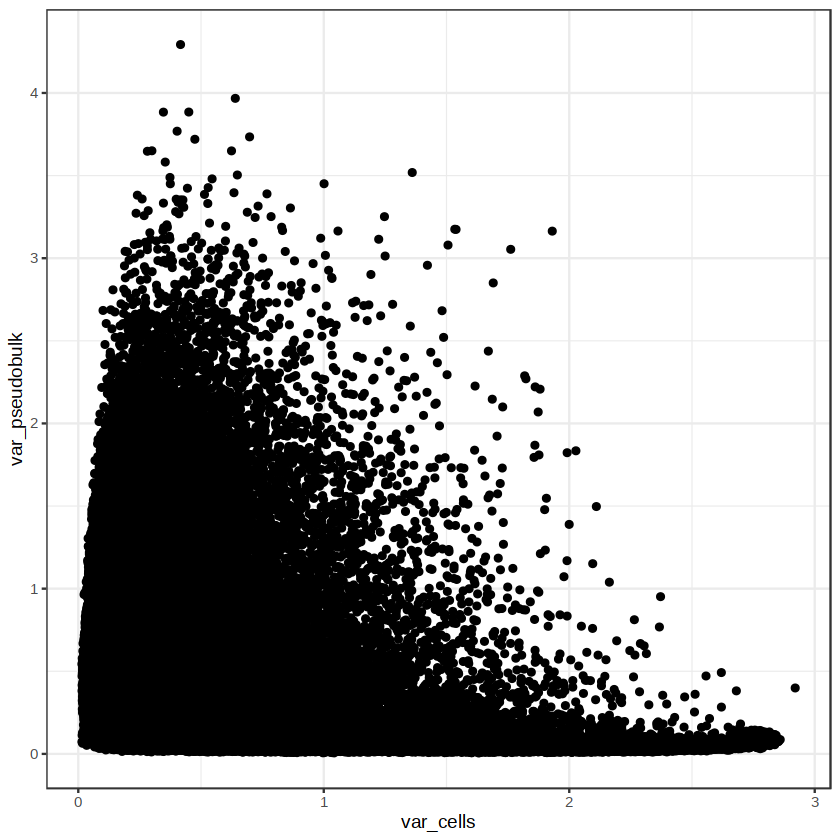

In [59]:
ggplot(feature_stats.dt, aes(var_cells, var_pseudobulk)) + 
    geom_point() + 
    theme_bw()

In [60]:
umap = fread(file.path(io$basedir, 'results/atac/archR/dimensionality_reduction/cells/PeakMatrix/remove_ExE_cells_FALSE/batch_correction_None/umap_nfeatures25000_dims20_nneighbour25_mindist0.3.txt.gz'))

In [69]:
as.vector(assay(atac_cells.se['chr1:3003473-3004073', 1:5]))

[1] 0 0 0 0 0

In [70]:
summary(umap$cell == colnames(atac_cells.se))

   Mode    TRUE 
logical   35536 

In [71]:
peak='chr1:3003473-3004073'
umap2 = cbind(umap, as.vector(assay(atac_cells.se[peak, ])))


In [81]:
plot_acc = function(peak='chr1:3003473-3004073'){
    umap2 = cbind(umap, as.vector(assay(atac_cells.se[peak, ])))
    umap2 = umap2[order(V2)]
    ggplot(umap2, aes(umap1, umap2, col=V2)) + 
        geom_point() + 
        viridis::scale_color_viridis(end=0, begin=1) + 
        theme_void()
}

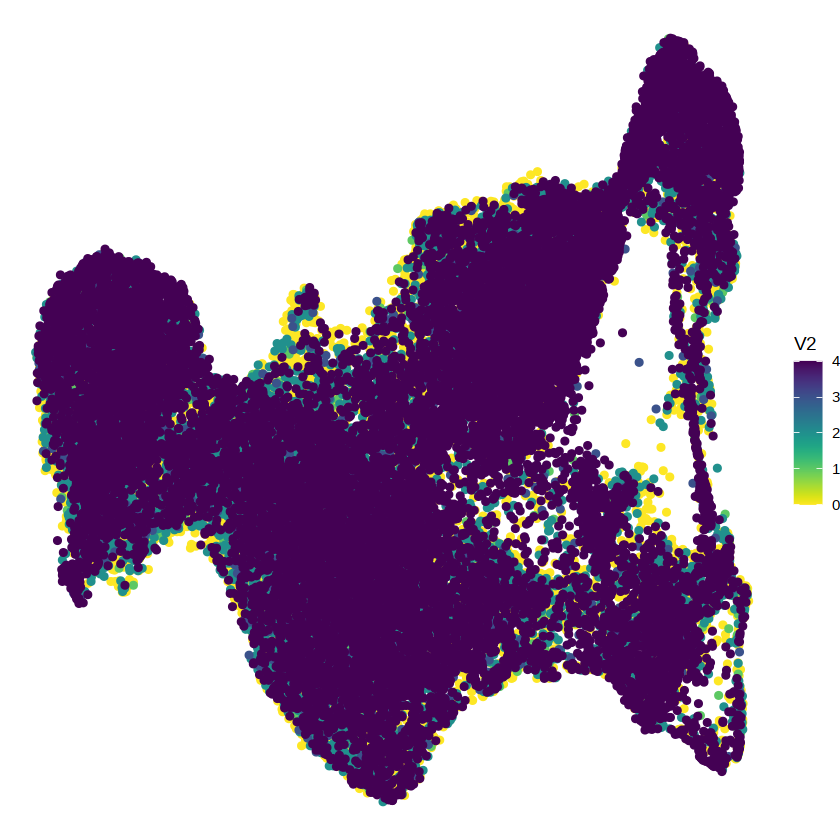

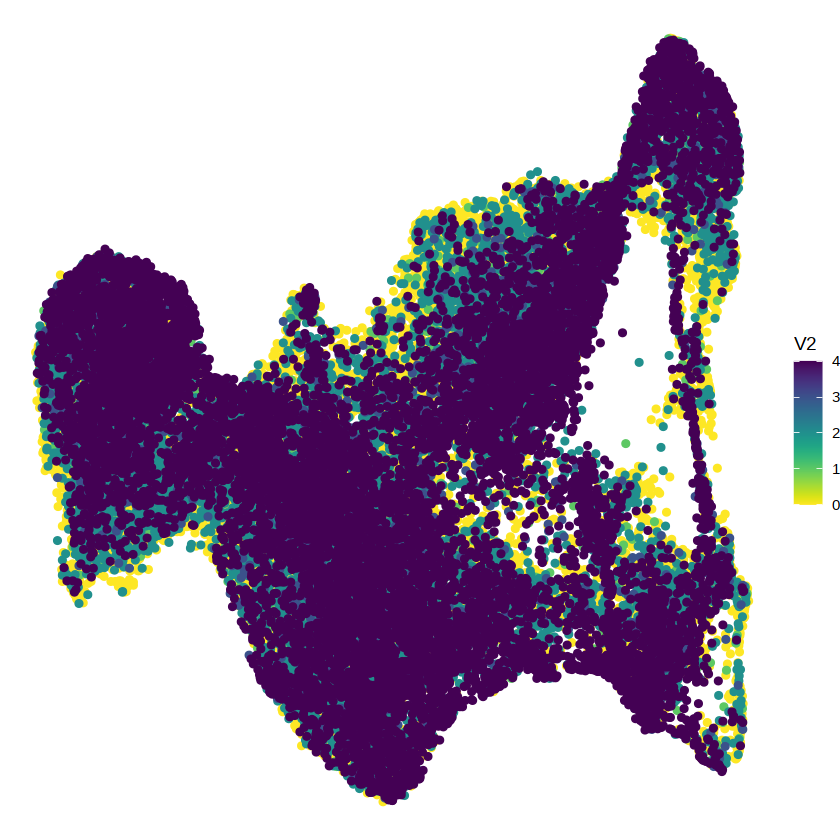

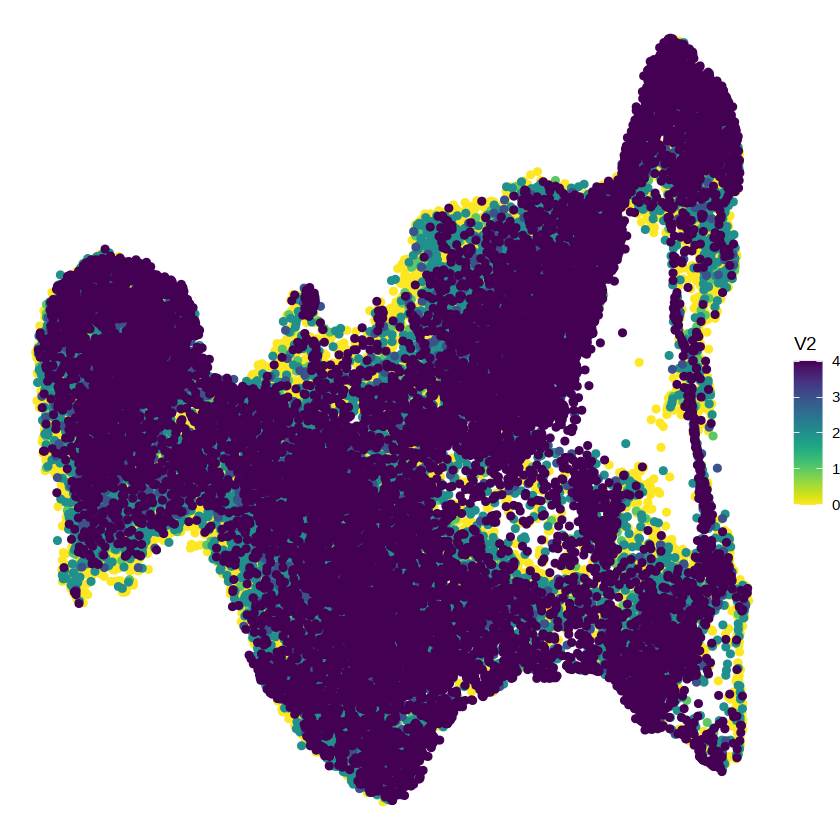

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


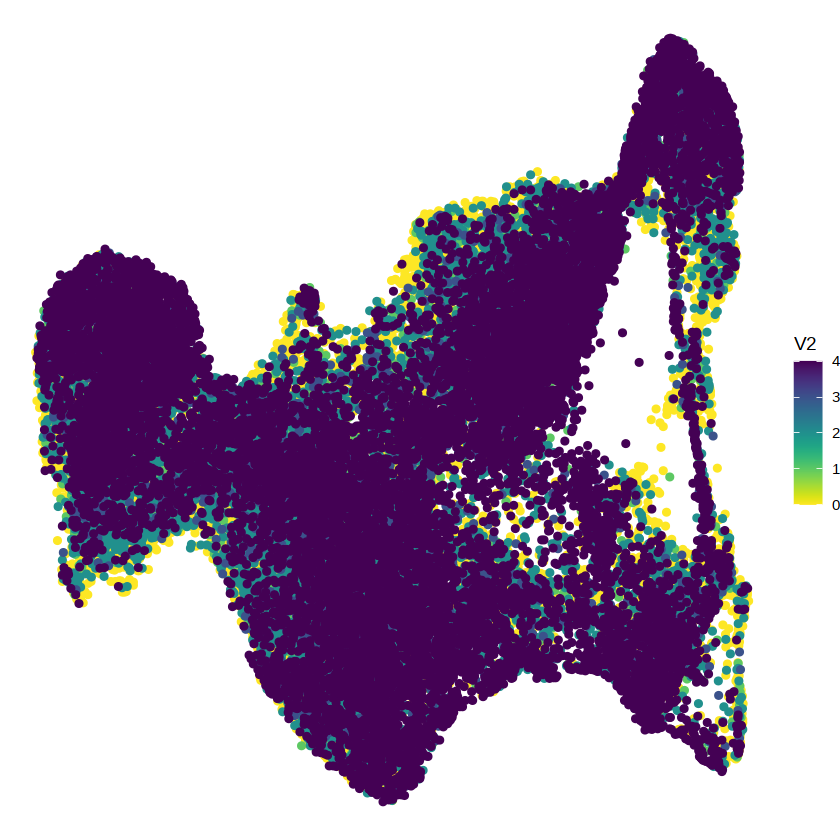

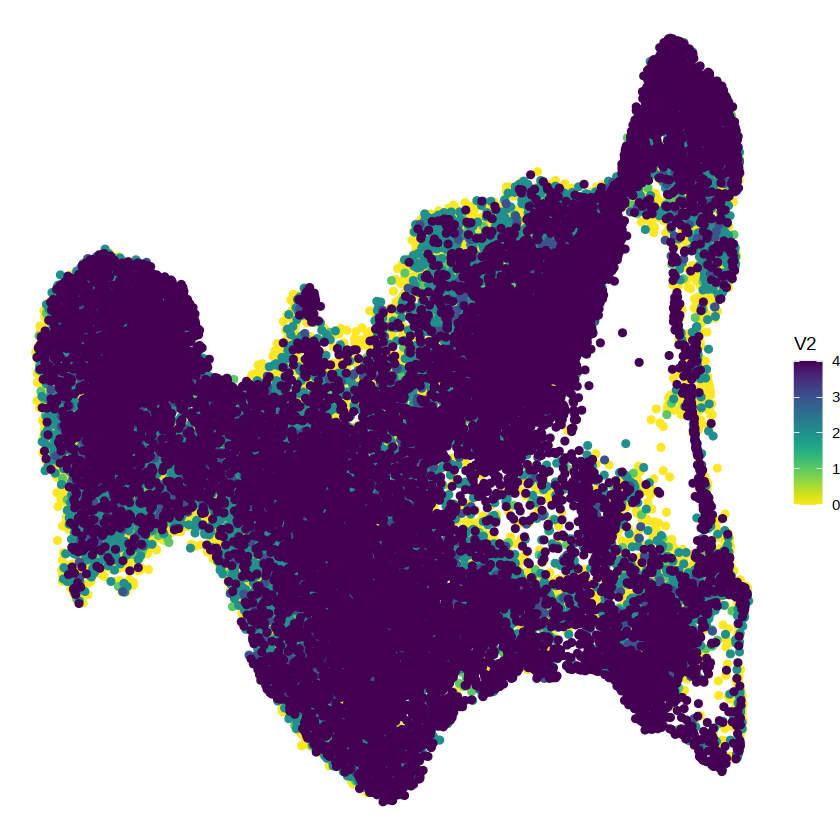

In [86]:
lapply(head(feature_stats.dt[order(-var_cells), feature], 5), plot_acc)

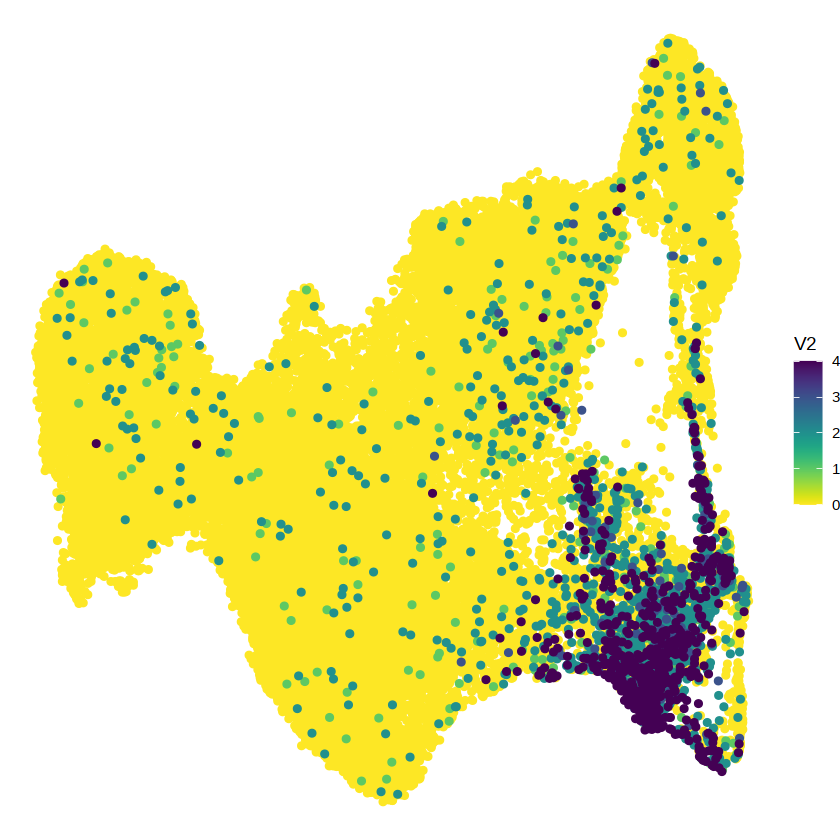

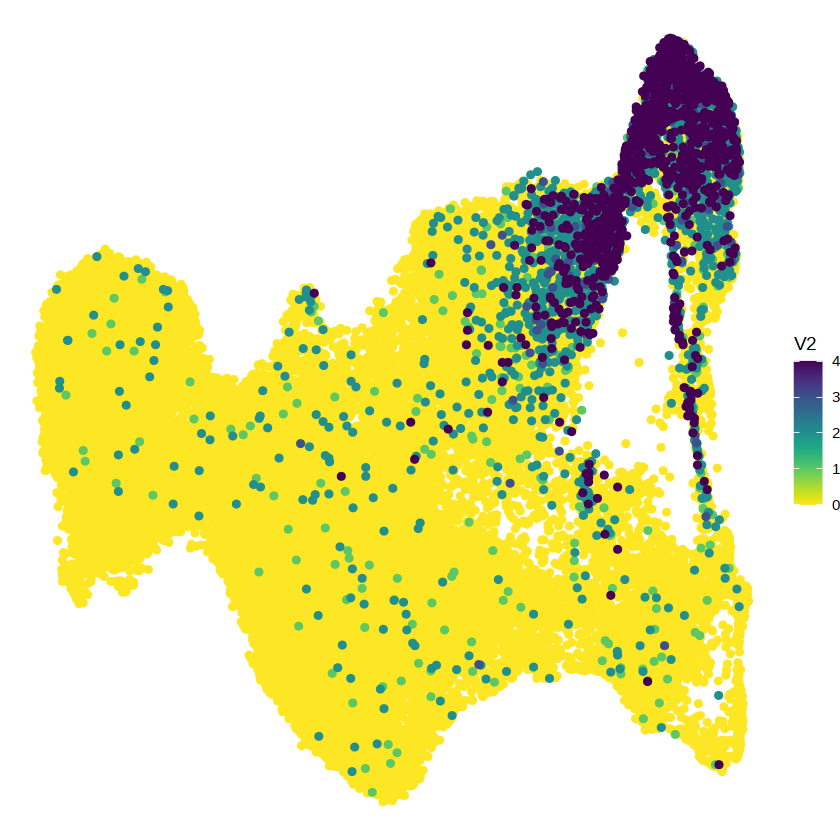

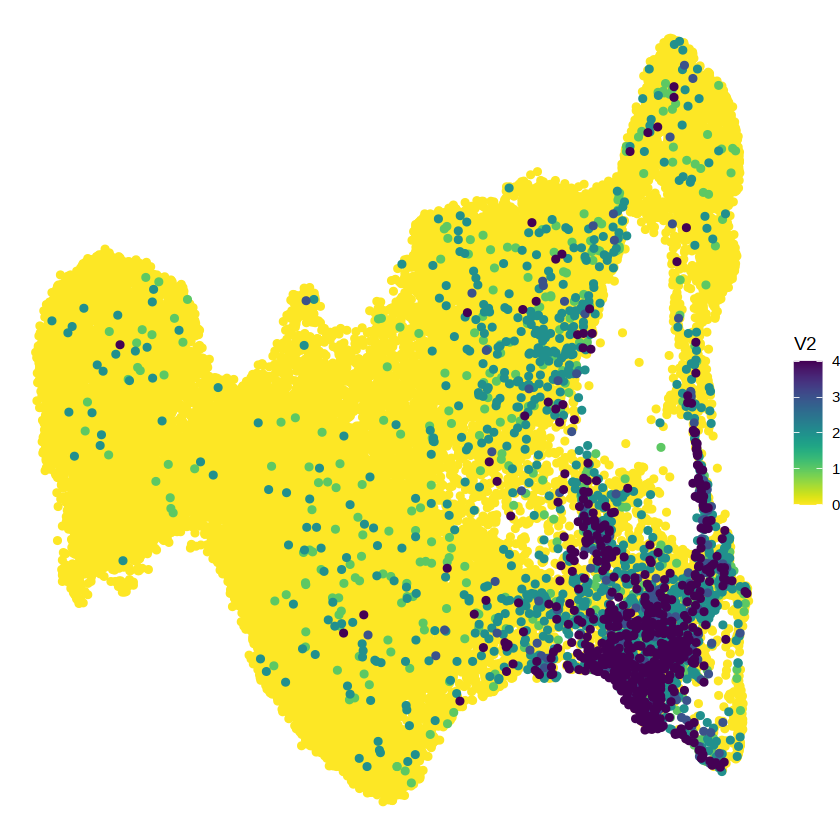

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


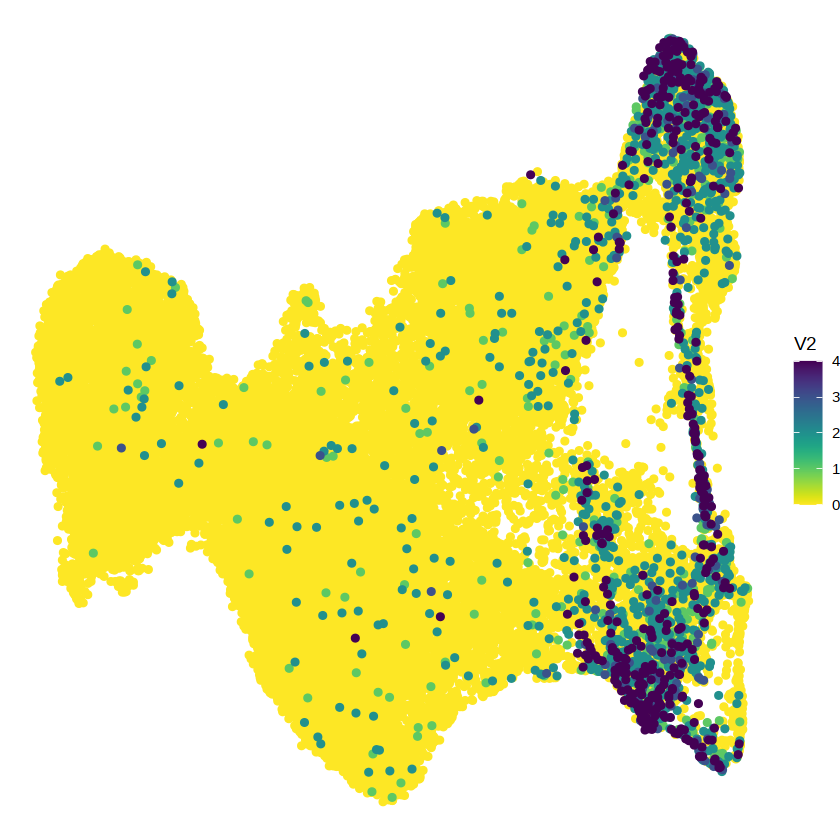

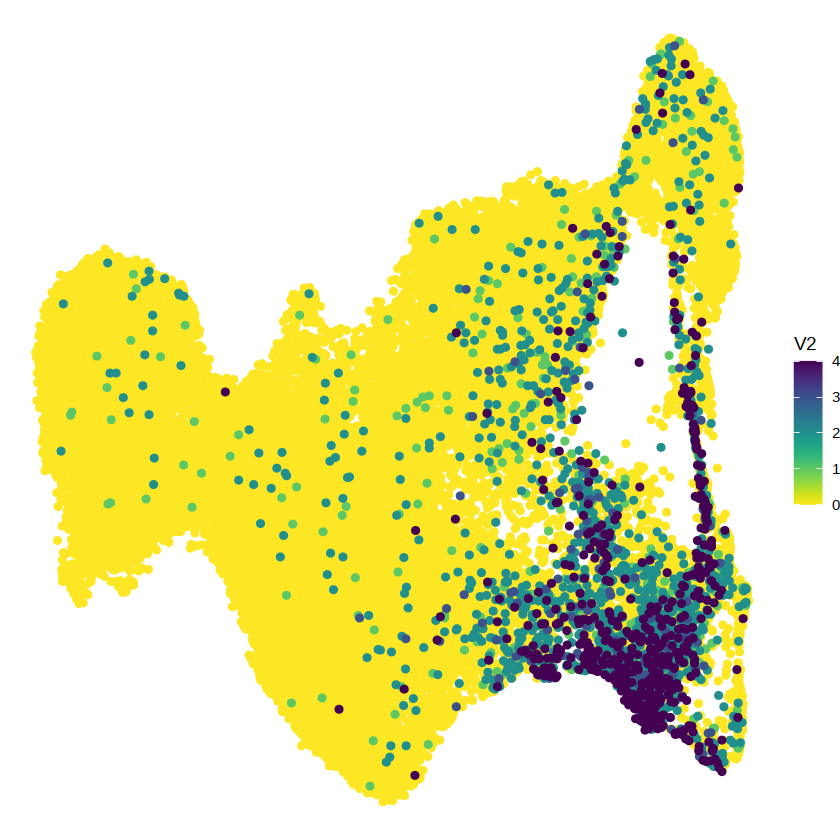

In [87]:
lapply(head(feature_stats.dt[order(-var_pseudobulk), feature], 5), plot_acc)

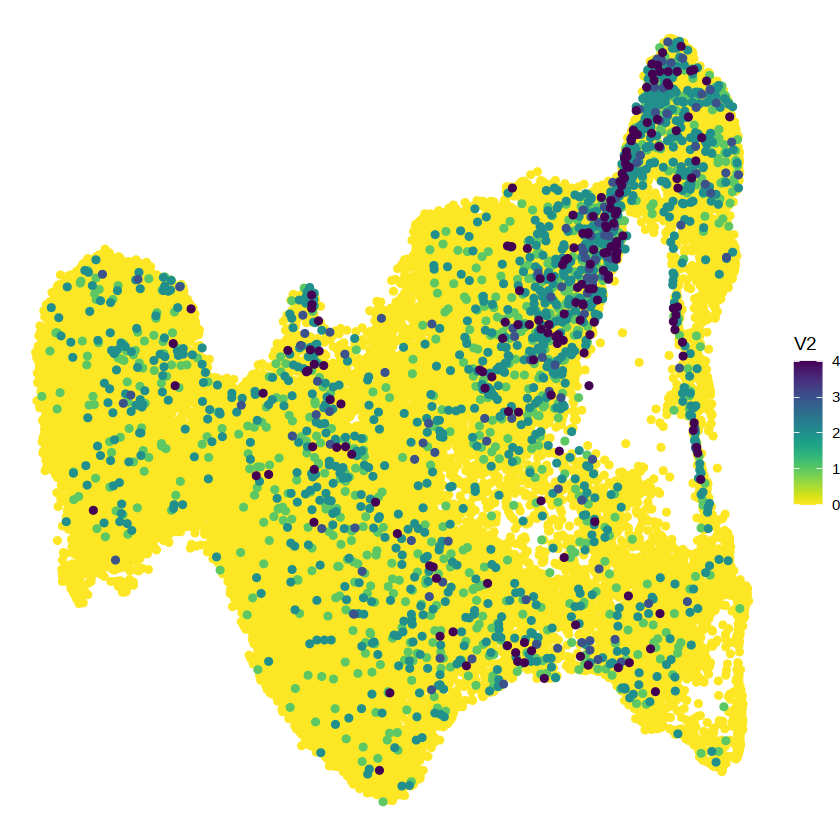

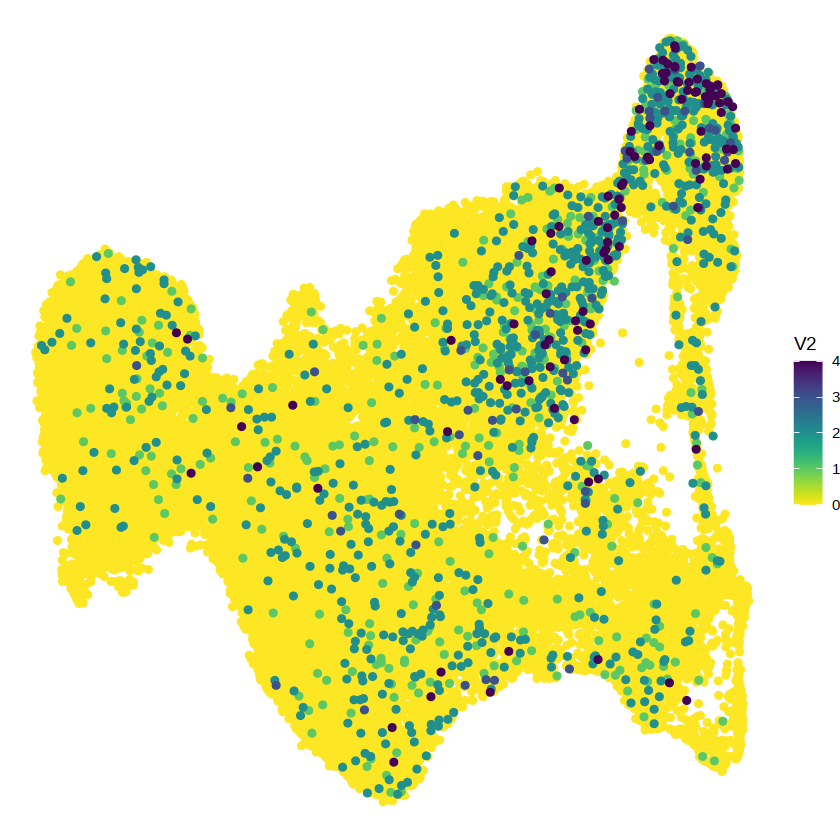

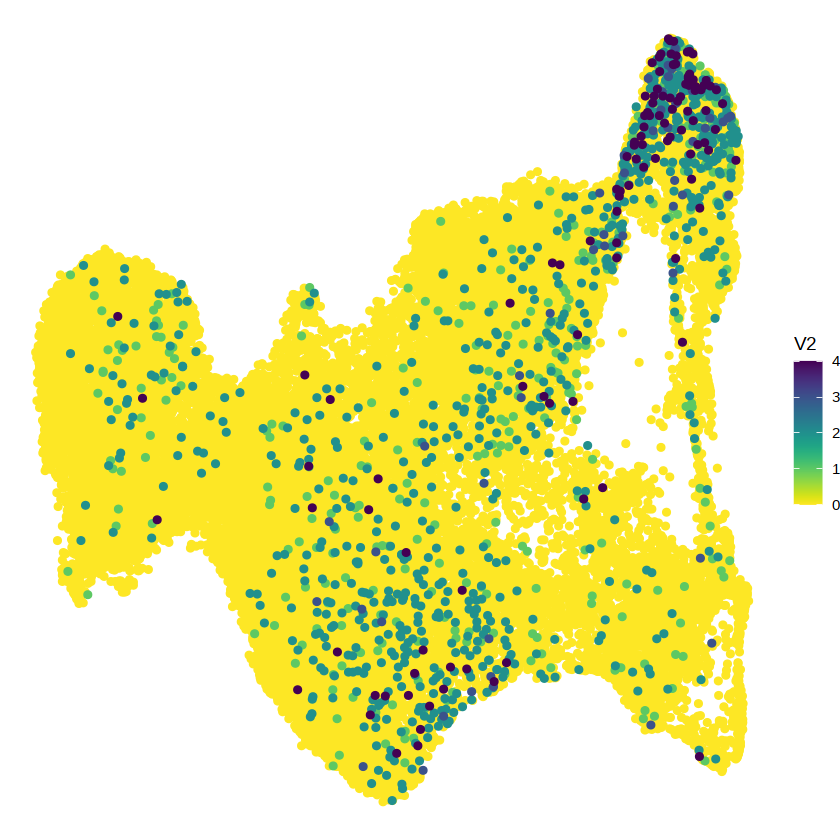

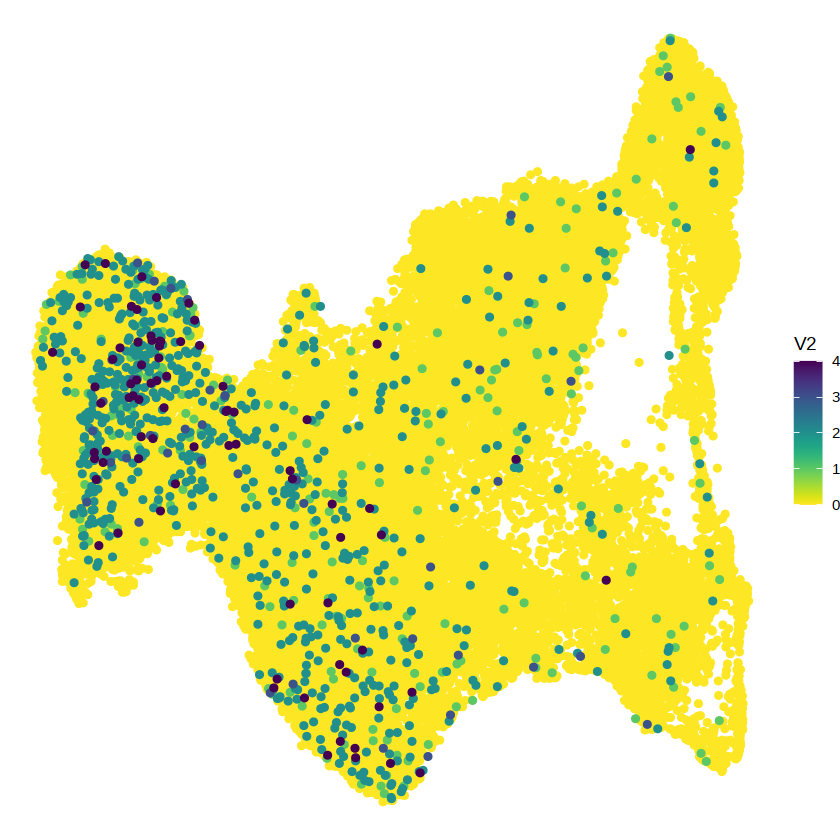

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]


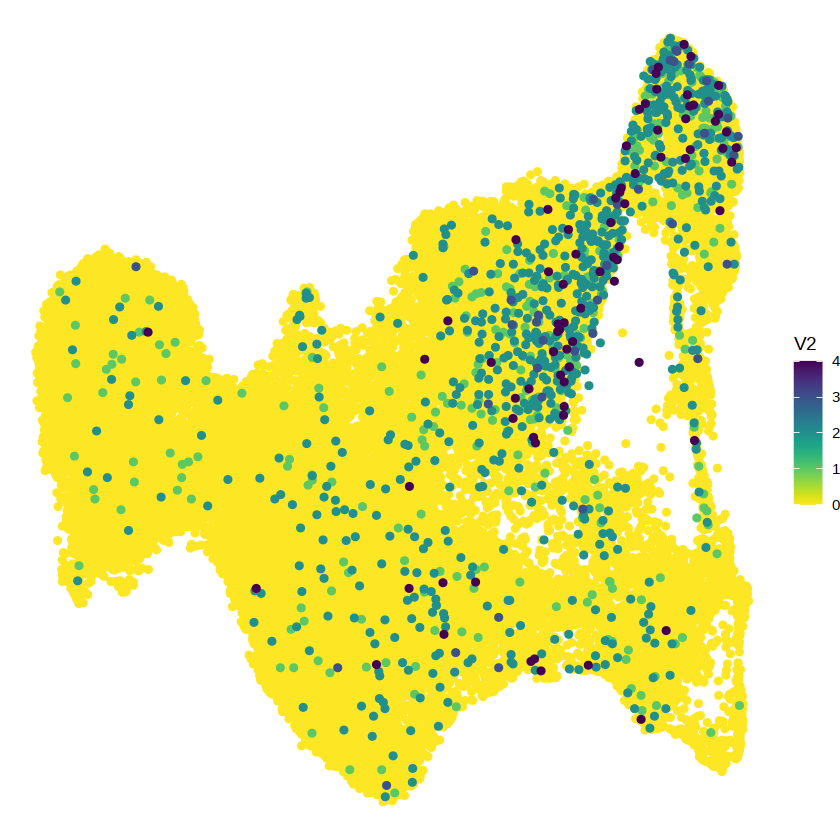

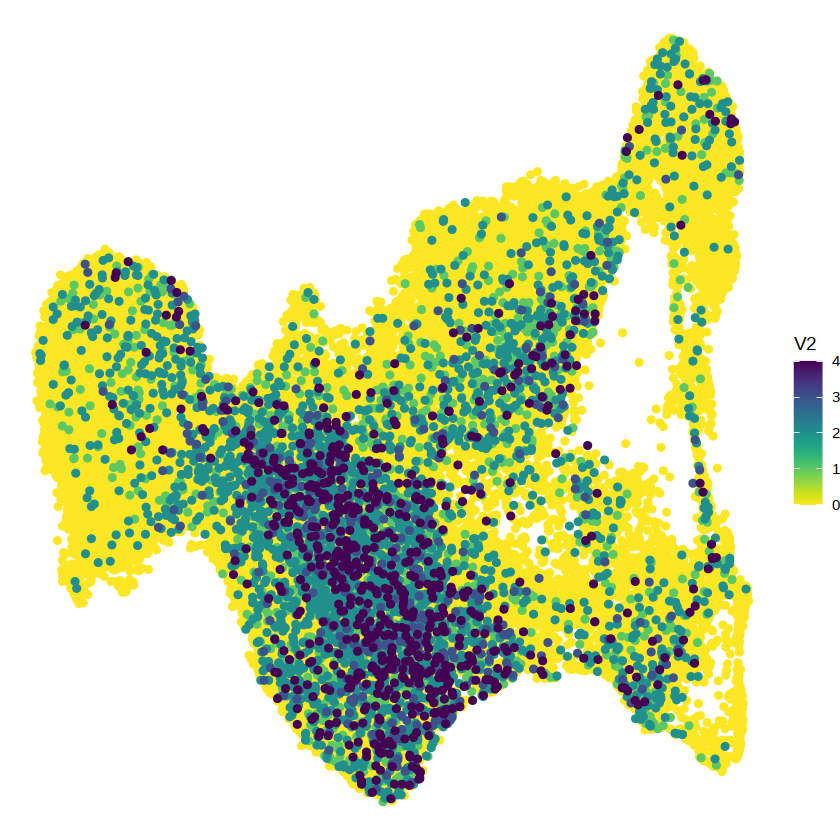

In [100]:
lapply(feature_stats.dt[order(-var_pseudobulk), feature][25000:25005], plot_acc)

In [89]:
head(feature_stats.dt)

feature,var_cells,mean_cells,var_pseudobulk,mean_pseudobulk
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
chr10:100013991-100014591,0.18513,0.08898,0.37550,1.04833
chr10:100015416-100016016,1.27518,0.63510,0.05492,3.89778
chr10:100016254-100016854,0.70841,0.36934,0.02266,3.11138
chr10:100017132-100017732,0.17581,0.09466,0.18041,1.26058
chr10:100018387-100018987,0.14059,0.07488,0.14195,1.05206
chr10:100019846-100020446,0.12512,0.06624,0.23196,1.09474


In [90]:
feature_stats.dt = feature_stats.dt[,vom:=var_pseudobulk/mean_pseudobulk]

In [93]:
head(feature_stats.dt)

feature,var_cells,mean_cells,var_pseudobulk,mean_pseudobulk,vom
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
chr10:100013991-100014591,0.18513,0.08898,0.37550,1.04833,0.358188738
chr10:100015416-100016016,1.27518,0.63510,0.05492,3.89778,0.014090072
chr10:100016254-100016854,0.70841,0.36934,0.02266,3.11138,0.007282942
chr10:100017132-100017732,0.17581,0.09466,0.18041,1.26058,0.143116661
chr10:100018387-100018987,0.14059,0.07488,0.14195,1.05206,0.134925765
chr10:100019846-100020446,0.12512,0.06624,0.23196,1.09474,0.211885927


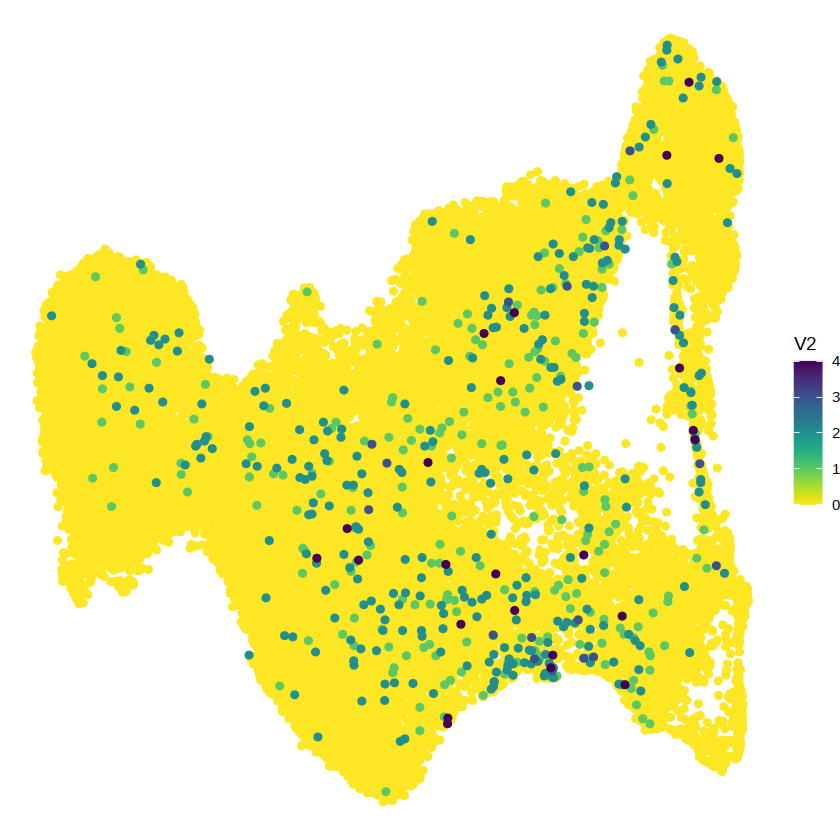

[[1]]

[[2]]

[[3]]


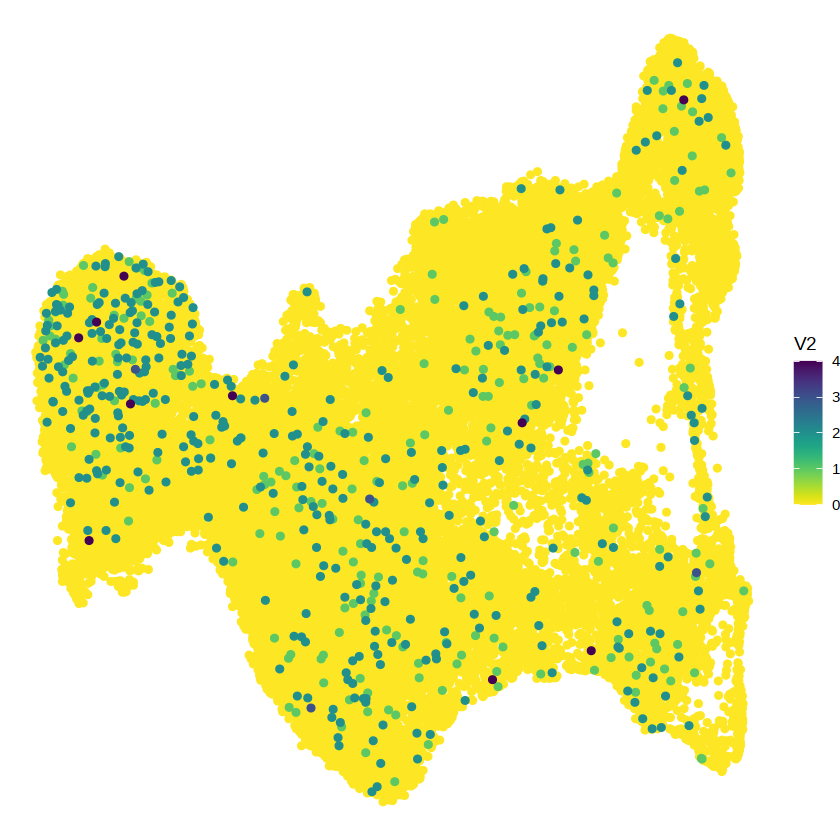

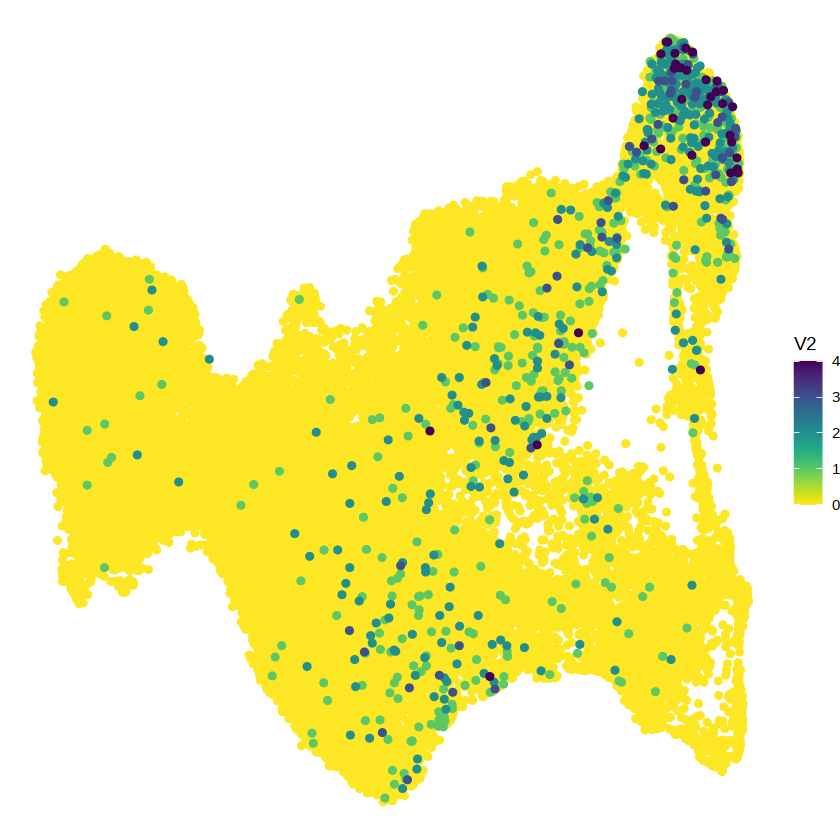

In [98]:
lapply(feature_stats.dt[order(-vom), feature][1000:1002], plot_acc)

In [101]:
head(cell_metadata.dt)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,⋯,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,Clusters_TileMatrix0.5,Clusters_TileMatrix_genotype,Clusters_PeakMatrix2,Clusters_PeakMatrix_genotype,Clusters_PeakMatrix2.1
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<int>,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,⋯,0.22,1.19,49080,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,⋯,0.17,1.56,46497,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,⋯,0.25,1.27,83426,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,⋯,0.21,1.48,30196,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_wt_rep1,D3,wt,⋯,0.21,1.48,13455,0.02,TRUE,C2,C2wt,C11,C11wt,C11
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_wt_rep1,D3,wt,⋯,0.23,1.33,9315,0.02,TRUE,C2,C2wt,C11,C11wt,C11


In [8]:
# Assess umap with top variable sites
vars = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/atac/archR/feature_stats/PeakMatrix/PeakMatrix_Clusters_PeakMatrix2_stats.txt.gz')[order(-var_pseudobulk)]

In [34]:
atac.vars = atac_cells.se[vars[1:55000, feature],]

In [35]:
atac_tfidf.mtx = tfidf(atac.vars@assays@data$PeakMatrix)

svd <- irlba::irlba(atac_tfidf.mtx, 35, 35)
svdDiag <- matrix(0, nrow=35, ncol=35)
diag(svdDiag) <- svd$d
lsi.mtx <- t(svdDiag %*% t(svd$v))
rownames(lsi.mtx) <- colnames(atac.vars)
colnames(lsi.mtx) <- paste0("LSI",seq_len(ncol(lsi.mtx)))

rm(svd,svdDiag); gc(reset=T)

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9596864,512.6,17256164,921.6,9596864,512.6
Vcells,1605531755,12249.3,2799992163,21362.3,1605531755,12249.3


In [36]:
library(uwot)

In [37]:
umap = umap(lsi.mtx)

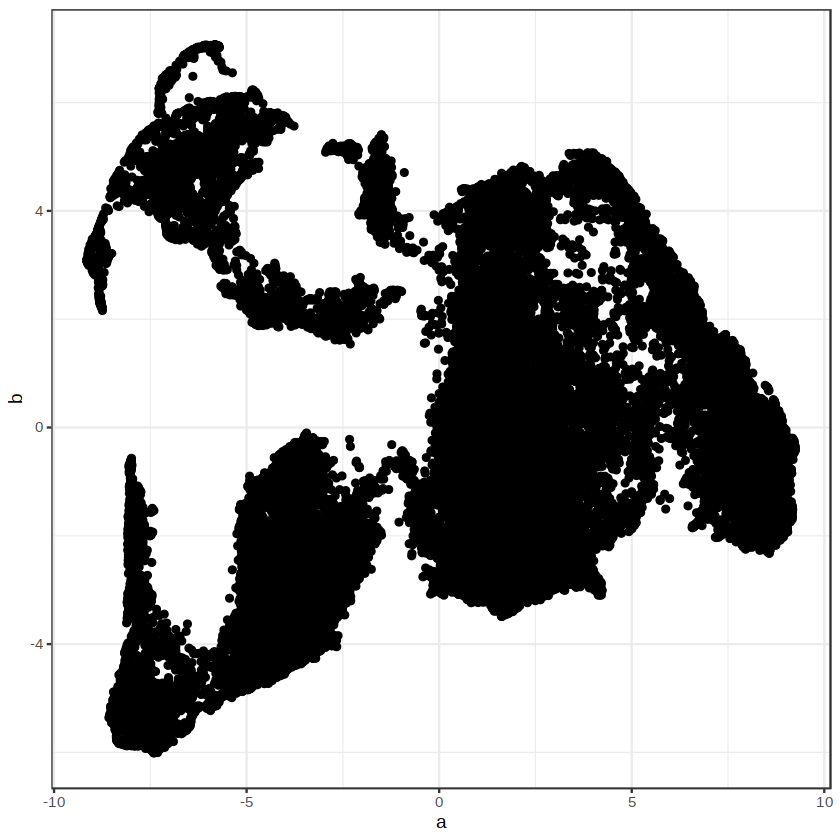

In [38]:
colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9618056,513.7,17256164,921.6,9618056,513.7
Vcells,1468752924,11205.7,4098110110,31266.1,1468752924,11205.7


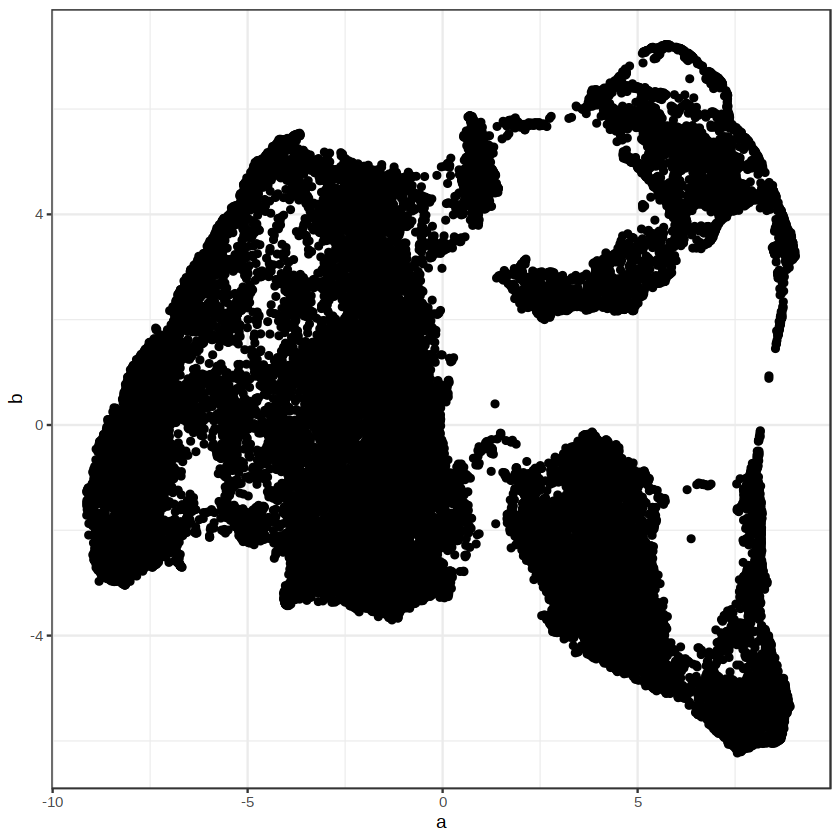

In [59]:
atac.vars = atac_cells.se[vars[1:45000, feature],]
atac_tfidf.mtx = tfidf(atac.vars@assays@data$PeakMatrix, method=1)

svd <- irlba::irlba(atac_tfidf.mtx, 25, 25)
svdDiag <- matrix(0, nrow=25, ncol=25)
diag(svdDiag) <- svd$d
lsi.mtx <- t(svdDiag %*% t(svd$v))
rownames(lsi.mtx) <- colnames(atac.vars)
colnames(lsi.mtx) <- paste0("LSI",seq_len(ncol(lsi.mtx)))

rm(svd,svdDiag); gc(reset=T)

umap = umap(lsi.mtx)

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

In [49]:
LSI = ArchR:::.computeLSI(mat = atac_cells.se[vars[1:45000, feature],]@assays@data$PeakMatrix)

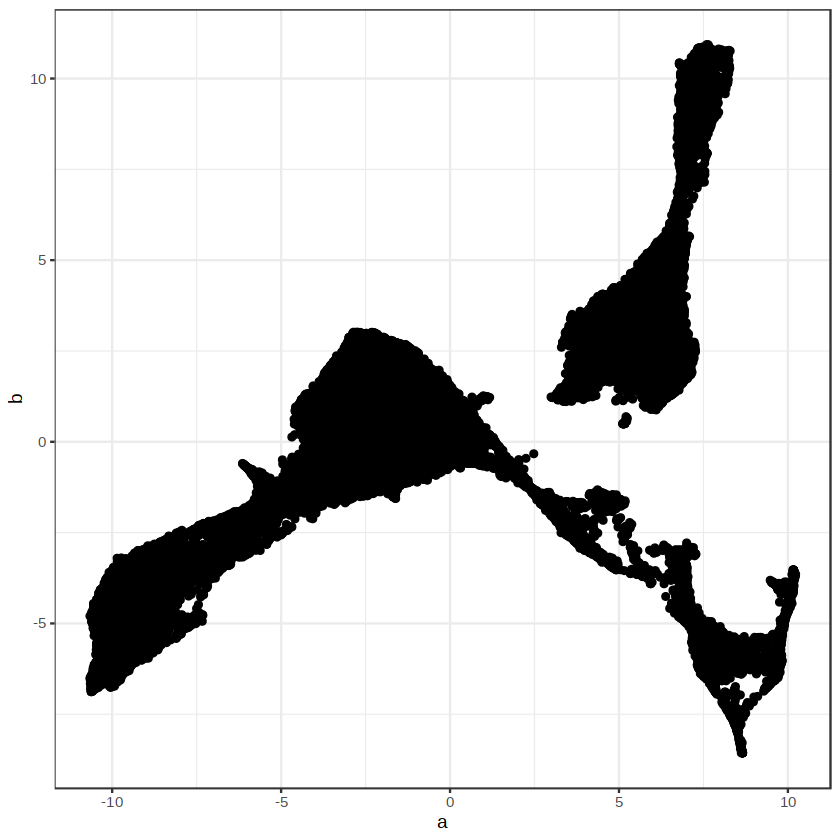

In [53]:
umap = umap(LSI$matSVD[,1:25])

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

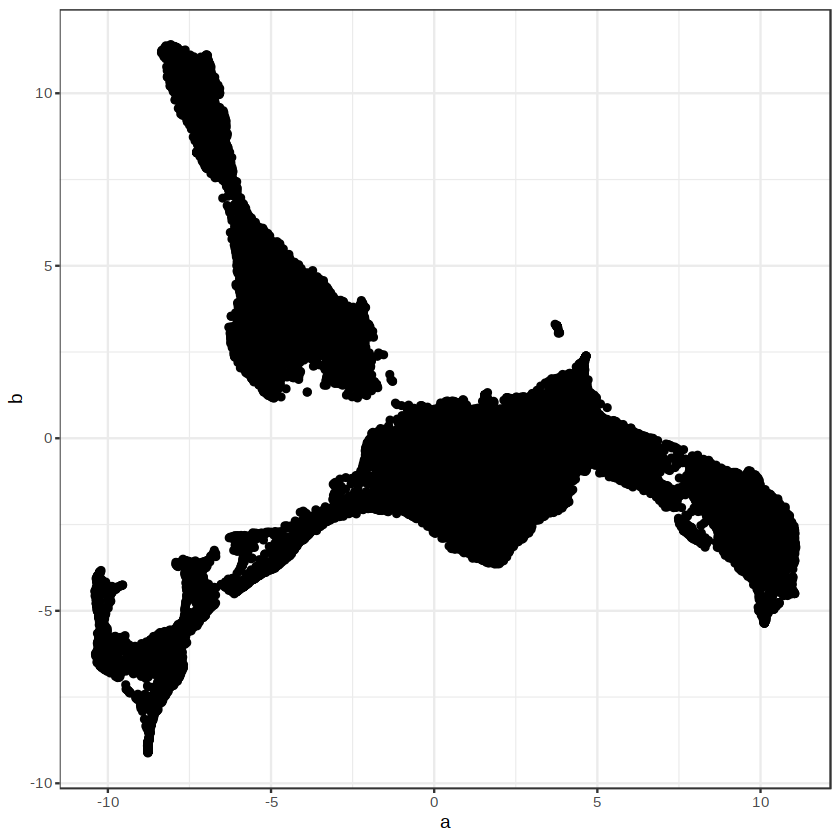

In [56]:
LSI = ArchR:::.computeLSI(mat = atac_cells.se[vars[1:45000, feature],]@assays@data$PeakMatrix, binarize=FALSE, nDimensions = 30)
umap = umap(LSI$matSVD[,1:25])

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

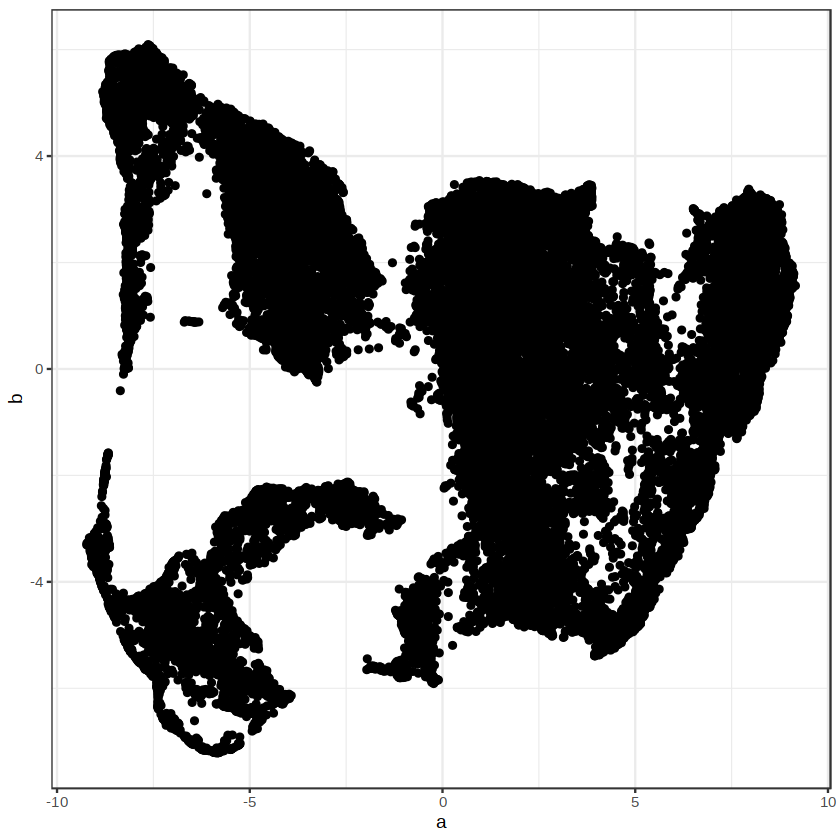

In [57]:
LSI = ArchR:::.computeLSI(mat = atac_cells.se[vars[1:45000, feature],]@assays@data$PeakMatrix, binarize=FALSE, nDimensions = 30, LSIMethod = 2)
umap = umap(LSI$matSVD[,1:25])

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

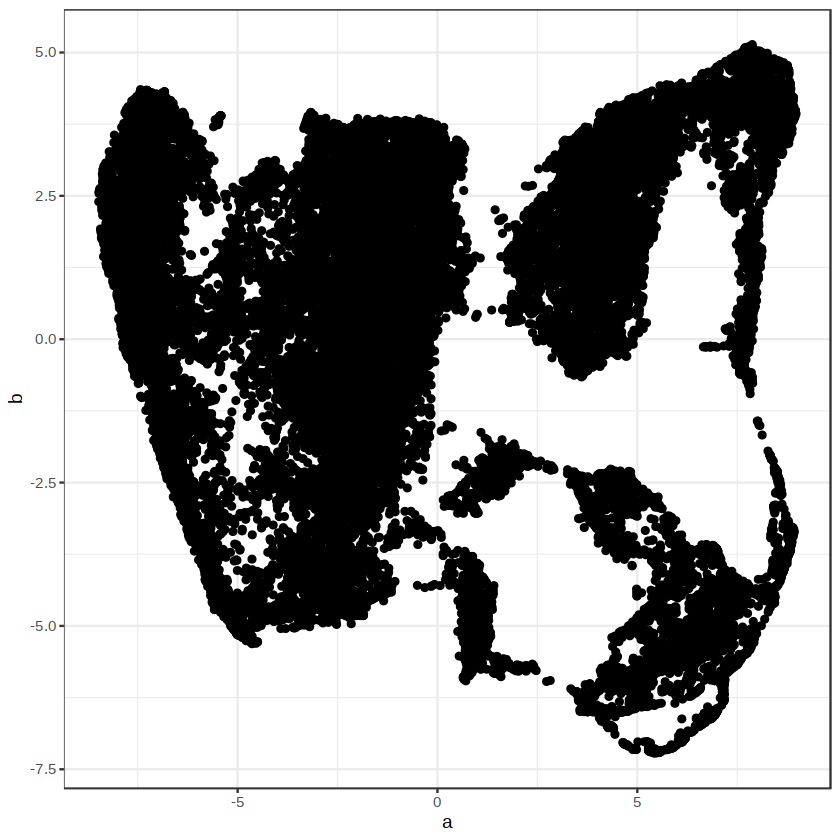

In [58]:
LSI = ArchR:::.computeLSI(mat = atac_cells.se[vars[1:45000, feature],]@assays@data$PeakMatrix, binarize=TRUE, nDimensions = 30, LSIMethod = 2)
umap = umap(LSI$matSVD[,1:25])

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

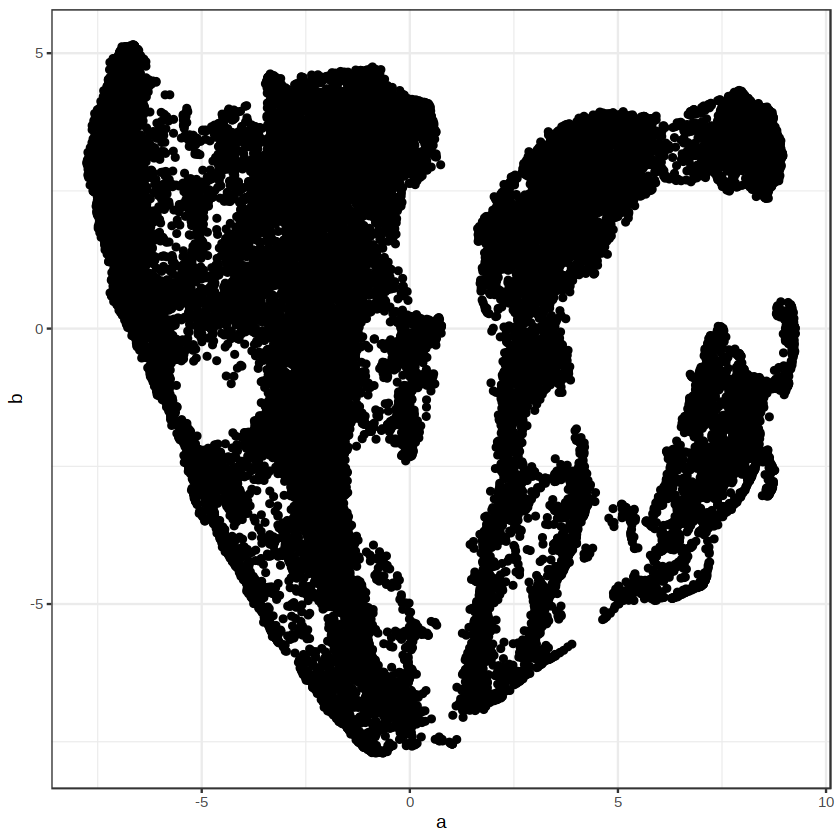

In [78]:
# With different lognorm method from ArchR instead of Ricard
LSI = ArchR:::.computeLSI(mat = atac_cells.se[feature_stats_pseudobulk.dt[1:45000, feature],]@assays@data$PeakMatrix, binarize=TRUE, nDimensions = 30, LSIMethod = 2)
umap = umap(LSI$matSVD[,1:25])

colnames(umap) = c('a', 'b')
ggplot(as.data.frame(umap), aes(a,b)) + 
    geom_point() + 
    theme_bw()

# Experiment Var Features on binarized count matrix

In [109]:
head(test)

cell,nFrags_atac,V2
<chr>,<int>,<dbl>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,49080,0
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,46497,0
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,83426,0
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,30196,0
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,13455,0
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,9315,0


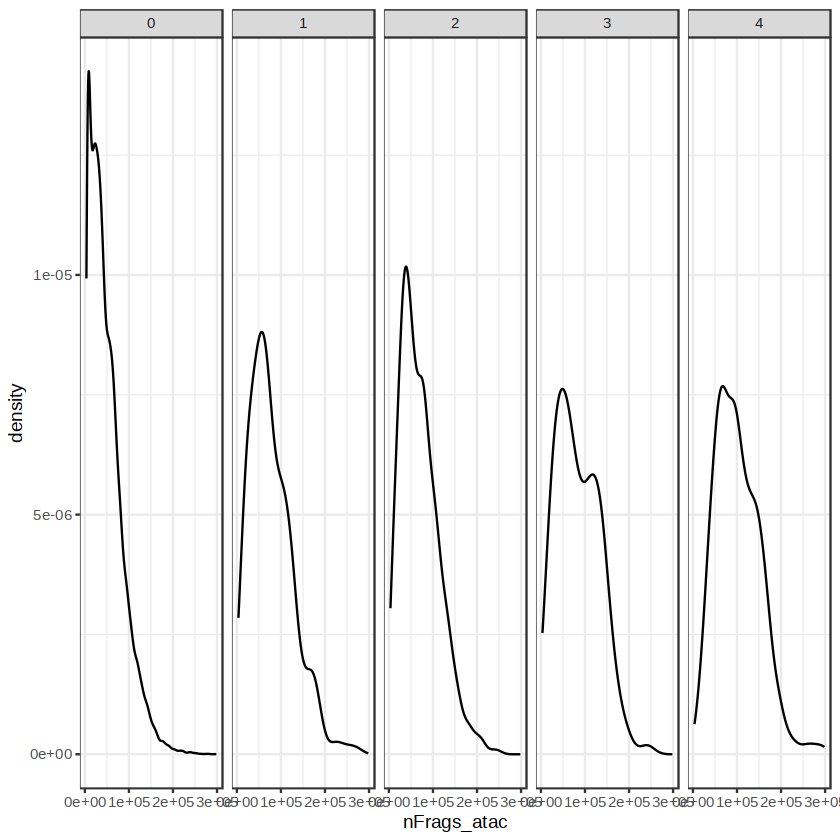

   Mode    TRUE 
logical   35536 

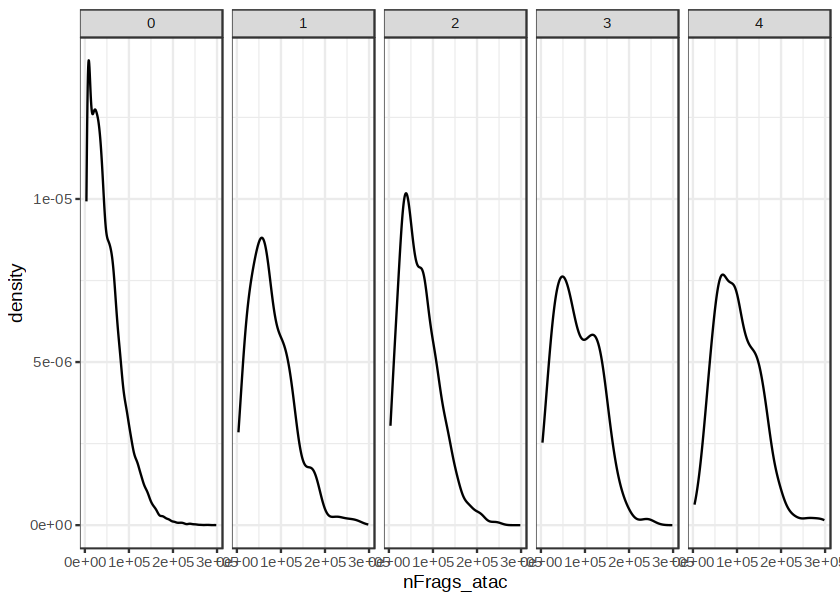

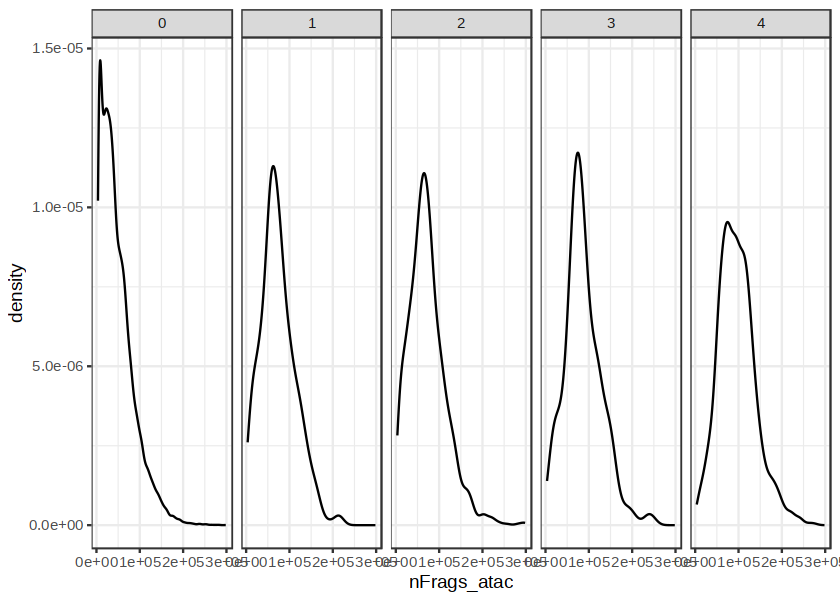

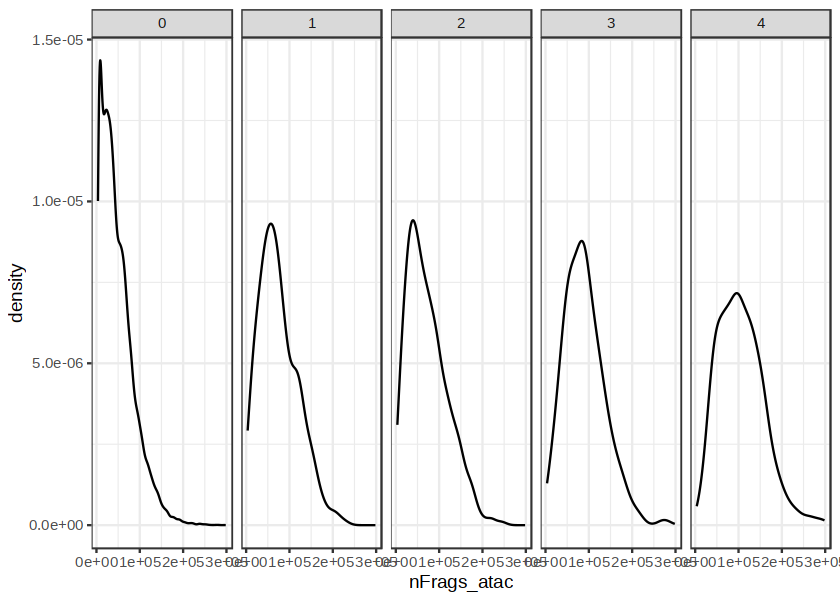

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


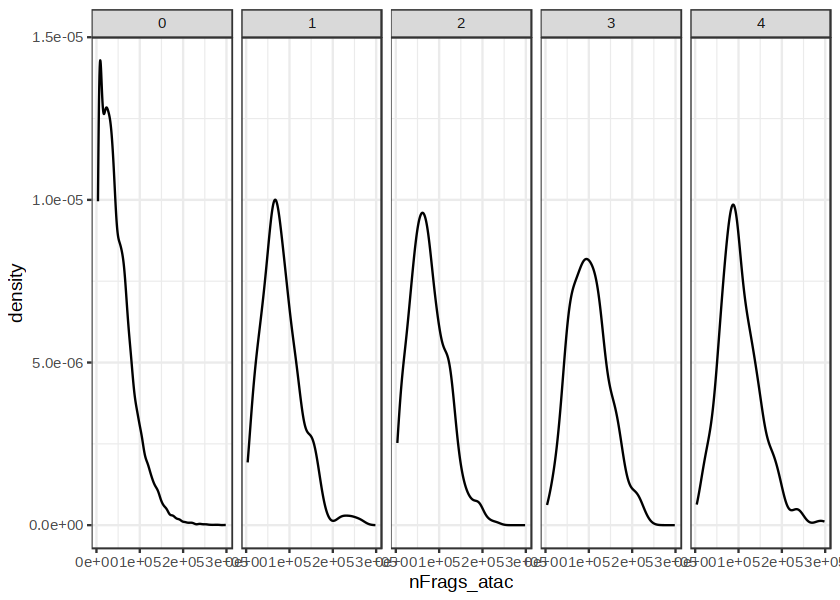

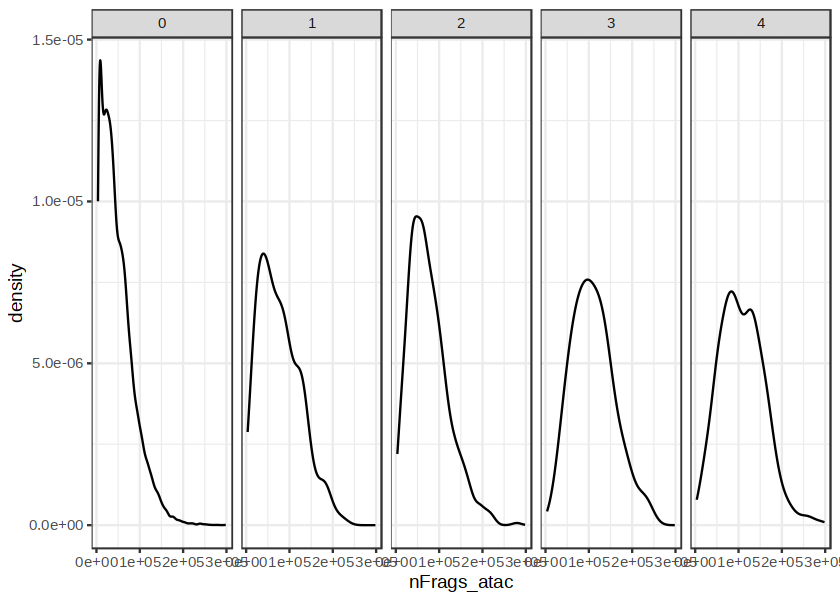

In [116]:
# First check correlation between read depth and top variable peak accessibility
summary(cell_metadata.dt$cell == colnames(atac_cells.se))
options(repr.plot.height=5)
plot_corr = function(peak){
    test = cbind(cell_metadata.dt[,c('cell', 'nFrags_atac')], as.vector(assay(atac_cells.se[peak,])))
    ggplot(test, aes(nFrags_atac)) +
        geom_density() + 
        facet_grid(~V2) +
        theme_bw()
}

lapply(feature_stats.dt[order(-var_pseudobulk), feature][1:5], plot_corr)

In [ ]:
peakmatrix = getMatrixFromProject(ArchRProject, useMatrix = "PeakMatrix",binarize =TRUE, threads =1)

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-221ba7f868db0-Date-2023-01-30_Time-13-30-17.log
If there is an issue, please report to github with logFile!

2023-01-30 13:34:13 : Organizing colData, 3.935 mins elapsed.

2023-01-30 13:34:14 : Organizing rowData, 3.948 mins elapsed.

2023-01-30 13:34:14 : Organizing rowRanges, 3.949 mins elapsed.

2023-01-30 13:34:14 : Organizing Assays (1 of 1), 3.949 mins elapsed.



In [ ]:
# pseudobulk binarized matrix
atac.pb = aggregateAcrossCells(atac_cells.se, id = cell_metadata.dt$Clusters_PeakMatrix2, statistics='mean')